In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
import cv2
import matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image


In [2]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("✅ Using device:", device)

✅ Using device: cuda


In [3]:
import os
import subprocess

def download_file(filepath: str, url: str):
    """Download file from URL using curl if it doesn't already exist."""
    if not os.path.exists(filepath):
        os.makedirs(os.path.dirname(filepath), exist_ok=True)
        print(f"Download to {filepath}...")
        subprocess.run(["curl", "-L", "-o", filepath, url], check=True)
    else:
        print(f"File already exists: {filepath}")

In [4]:
import zipfile

def extract_zip_file(zip_path: str, extract_path: str):
    """Extract ZIP file to target path if it exists."""
    if os.path.exists(zip_path):
        with zipfile.ZipFile(zip_path, 'r') as zip_ref:
            zip_ref.extractall(extract_path)
        print(f"✅ Dataset extracted to: {extract_path}")
    else:
        print(f"⚠️ ZIP file not found: {zip_path}")

In [5]:
import os
import zipfile
from tqdm import tqdm

def unzip_file(zip_path, extract_to):
    if os.path.exists(extract_to) and any(os.scandir(extract_to)):
        print(f"⚠️ Skipping extraction to {extract_to} (already populated)")
        return

    print(f"📦 Extracting {os.path.basename(zip_path)} → {extract_to}")
    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        members = zip_ref.infolist()
        for member in tqdm(members, desc="Extracting", unit="file"):
            zip_ref.extract(member, extract_to)

def unzip_folder(zip_path, extract_to, sub_dir="train"):
    expected_path = os.path.join(extract_to, sub_dir)
    if os.path.exists(expected_path) and any(os.scandir(expected_path)):
        print(f"⚠️ Skipping extraction: {expected_path} already populated")
        return

    print(f"📦 Extracting {os.path.basename(zip_path)} → {extract_to}")
    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        for member in tqdm(zip_ref.infolist(), desc="Extracting", unit="file"):
            zip_ref.extract(member, extract_to)


In [6]:
import os
import requests
from tqdm import tqdm

def download_big_file(dest_path,url):
    # Ensure destination directory exists
    os.makedirs(os.path.dirname(dest_path), exist_ok=True)

    if os.path.exists(dest_path):
        print(f"✅ Skipping {os.path.basename(dest_path)} (already exists)")
        return

    response = requests.get(url, stream=True)
    total = int(response.headers.get('content-length', 0))

    with open(dest_path, 'wb') as file, tqdm(
        desc=os.path.basename(dest_path),
        total=total,
        unit='B',
        unit_scale=True,
        unit_divisor=1024,
    ) as bar:
        for data in response.iter_content(chunk_size=1024):
            size = file.write(data)
            bar.update(size)

In [7]:
# from google.colab import drive
# drive.mount('/content/drive')

In [8]:
raw_zip_dir = "DLCV_Lab_Dataset/raw_zips/pascal-voc-2007.zip"
source_url = "https://www.kaggle.com/api/v1/datasets/download/zaraks/pascal-voc-2007"
download_big_file(raw_zip_dir, source_url)

✅ Skipping pascal-voc-2007.zip (already exists)


In [9]:
zip_path = "/content/DLCV_Lab_Dataset/raw_zips/pascal-voc-2007.zip"
extract_path = "DLCV_Lab_Dataset"
unzip_folder(zip_path, extract_path)

📦 Extracting pascal-voc-2007.zip → DLCV_Lab_Dataset


Extracting: 100%|██████████| 42574/42574 [00:25<00:00, 1699.84file/s]


In [118]:
raw_zip_dir = "yolo/raw_zips/yolov3-weights.zip"
source_url = "https://www.kaggle.com/api/v1/datasets/download/shivam316/yolov3-weights"
download_file(raw_zip_dir, source_url)

Download to yolo/raw_zips/yolov3-weights.zip...


In [119]:
zip_path = "yolo/raw_zips/yolov3-weights.zip"
extract_path = "yolo"
unzip_folder(zip_path, extract_path)

📦 Extracting yolov3-weights.zip → yolo


Extracting: 100%|██████████| 1/1 [00:01<00:00,  1.69s/file]


In [10]:
import os
import xml.etree.ElementTree as ET
from PIL import Image
from torch.utils.data import Dataset
import torch
import torchvision.transforms as T

VOC_CLASSES = [
 'aeroplane','bicycle','bird','boat','bottle','bus','car','cat','chair','cow',
 'diningtable','dog','horse','motorbike','person','pottedplant','sheep','sofa','train','tvmonitor'
]

class VOCDatasetYOLO(Dataset):
    def __init__(self, root, image_set='train', transforms=None):
        """
        root: path to /VOC2012_train_val/VOC2012_train_val
        image_set: 'train', 'val', or 'trainval'
        """
        self.root = root
        self.image_dir = os.path.join(root, "JPEGImages")
        self.ann_dir   = os.path.join(root, "Annotations")
        set_file = os.path.join(root, "ImageSets", "Main", f"{image_set}.txt")

        with open(set_file) as f:
            self.ids = [line.strip() for line in f.readlines()]
        self.transforms = transforms or T.Compose([
            T.Resize((416,416)),
            T.ToTensor()
        ])

    def __len__(self):
        return len(self.ids)

    def parse_annotation(self, ann_path):
        tree = ET.parse(ann_path)
        boxes, labels = [], []
        for obj in tree.findall("object"):
            cls = obj.find("name").text.lower().strip()
            if cls not in VOC_CLASSES:
                continue
            label = VOC_CLASSES.index(cls)
            bndbox = obj.find("bndbox")
            x1 = float(bndbox.find("xmin").text)
            y1 = float(bndbox.find("ymin").text)
            x2 = float(bndbox.find("xmax").text)
            y2 = float(bndbox.find("ymax").text)
            boxes.append([x1, y1, x2, y2])
            labels.append(label)
        return torch.tensor(boxes, dtype=torch.float32), torch.tensor(labels, dtype=torch.long)

    def __getitem__(self, idx):
        img_id = self.ids[idx]
        img_path = os.path.join(self.image_dir, f"{img_id}.jpg")
        ann_path = os.path.join(self.ann_dir,  f"{img_id}.xml")

        img = Image.open(img_path).convert("RGB")
        boxes, labels = self.parse_annotation(ann_path)
        if self.transforms:
            img = self.transforms(img)
        target = {"boxes": boxes, "labels": labels, "image_id": img_id}
        return img, target


In [126]:
import torch
import torch.nn as nn

# ───────────────────────────────
# Conv + BatchNorm + LeakyReLU
# ───────────────────────────────
class ConvBNLeaky(nn.Module):
    def __init__(self, in_c, out_c, k=3, s=1, p=1):
        super().__init__()
        self.block = nn.Sequential(
            nn.Conv2d(in_c, out_c, k, s, p, bias=False),
            nn.BatchNorm2d(out_c),
            nn.LeakyReLU(0.1, inplace=True)
        )
    def forward(self, x): return self.block(x)

# ───────────────────────────────
# YOLOv3-Tiny Detector
# ───────────────────────────────
class YOLOv3Tiny(nn.Module):
    """
    Small YOLOv3-Tiny-style model.
    Compatible with Pascal VOC (20 classes) or COCO (80 classes)
    by changing num_classes.
    """
    def __init__(self, num_classes=20):
        super().__init__()
        self.num_classes = num_classes
        self.num_anchors = 3
        self.filters = self.num_anchors * (5 + num_classes)  # 75 (VOC) or 255 (COCO)

        # Backbone
        self.layer1 = ConvBNLeaky(3, 16);   self.pool1 = nn.MaxPool2d(2,2)
        self.layer2 = ConvBNLeaky(16, 32);  self.pool2 = nn.MaxPool2d(2,2)
        self.layer3 = ConvBNLeaky(32, 64);  self.pool3 = nn.MaxPool2d(2,2)
        self.layer4 = ConvBNLeaky(64, 128); self.pool4 = nn.MaxPool2d(2,2)
        self.layer5 = ConvBNLeaky(128, 256);self.pool5 = nn.MaxPool2d(2,2)
        self.layer6 = ConvBNLeaky(256, 512);self.pool6 = nn.MaxPool2d(2,1,1)
        self.layer7 = ConvBNLeaky(512, 1024)

        # Detection heads
        self.conv8  = ConvBNLeaky(1024, 256, k=1, s=1, p=0)
        self.det1   = nn.Conv2d(256, self.filters, 1)          # 13×13 output
        self.conv9  = ConvBNLeaky(256, 128, k=1, s=1, p=0)
        self.upsamp = nn.Upsample(scale_factor=2, mode="nearest")
        self.det2_conv = ConvBNLeaky(384, 256, k=3, s=1, p=1)
        self.det2   = nn.Conv2d(256, self.filters, 1)          # 26×26 output

    def forward(self, x):
      # -----------------------------
      # Backbone: feature extraction
      # -----------------------------
      x = self.layer1(x)      # 416 → 416, 3→16
      x = self.pool1(x)       # 208×208
      x = self.layer2(x)      # 208 → 208, 16→32
      x = self.pool2(x)       # 104×104
      x = self.layer3(x)      # 104 → 104, 32→64
      x = self.pool3(x)       # 52×52
      x = self.layer4(x)      # 52 → 52, 64→128
      x = self.pool4(x)       # 26×26
      route = self.layer5(x)  # save feature map for skip connection (26×26)
      x = self.pool5(route)   # 13×13
      x = self.layer6(x)      # 13×13
      x = self.pool6(x)       # still 13×13
      x = self.layer7(x)      # 13×13 → deep features (1024 channels)

      # -----------------------------
      # Detection Head 1  (13 × 13)
      # -----------------------------
      y1_in = self.conv8(x)   # 1024→256
      det1  = self.det1(y1_in)  # [B, 75, 13, 13]   (3 × (5 + 20))

      # -----------------------------
      # Detection Head 2  (26 × 26)
      # -----------------------------
      y2_in = self.conv9(y1_in)     # 256→128
      y2_in = self.upsamp(y2_in)    # 13 → 26 (ideally)

      # ✅ Align spatial sizes before concatenation (fixes 26 vs 28 bug)
      if y2_in.shape[-2:] != route.shape[-2:]:
          y2_in = nn.functional.interpolate(
              y2_in, size=route.shape[-2:], mode="nearest"
          )

      # Concatenate with earlier feature map
      y2_in = torch.cat([y2_in, route], dim=1)  # 128 + 256 = 384 channels
      y2_in = self.det2_conv(y2_in)             # 384→256
      det2  = self.det2(y2_in)                  # [B, 75, 26, 26]

      # -----------------------------
      # Outputs from both scales
      # -----------------------------
      return [det1, det2]

    def load_weights(self, weights_path, strict=False):
        """
        Load pretrained Darknet .weights file into the PyTorch YOLOv3-Tiny model.

        Args:
            weights_path (str): path to .weights file from Darknet (e.g. yolov3-tiny.weights)
            strict (bool): if True, enforce exact layer match (for COCO → COCO);
                           if False, skip mismatched shapes (for COCO → VOC fine-tune)
        """
        import numpy as np
        if not os.path.isfile(weights_path):
            raise FileNotFoundError(f"❌ Weights file not found: {weights_path}")

        with open(weights_path, "rb") as f:
            header = np.fromfile(f, dtype=np.int32, count=5)
            weights = np.fromfile(f, dtype=np.float32)
        print(f"🔹 Darknet header: {header[:3].tolist()}, seen={header[3]}")

        ptr, loaded, skipped = 0, 0, 0
        for m in self.modules():
            # --------------------- Conv + BN ---------------------
            if isinstance(m, ConvBNLeaky):
                conv_layer = m.conv
                bn_layer = m.bn
                num_bn = bn_layer.bias.numel()

                # Load BN params
                bn_biases        = torch.from_numpy(weights[ptr:ptr+num_bn]); ptr += num_bn
                bn_weights       = torch.from_numpy(weights[ptr:ptr+num_bn]); ptr += num_bn
                bn_running_mean  = torch.from_numpy(weights[ptr:ptr+num_bn]); ptr += num_bn
                bn_running_var   = torch.from_numpy(weights[ptr:ptr+num_bn]); ptr += num_bn

                bn_layer.bias.data.copy_(bn_biases.view_as(bn_layer.bias))
                bn_layer.weight.data.copy_(bn_weights.view_as(bn_layer.weight))
                bn_layer.running_mean.data.copy_(bn_running_mean.view_as(bn_layer.running_mean))
                bn_layer.running_var.data.copy_(bn_running_var.view_as(bn_layer.running_var))

                # Load conv weights
                num_w = conv_layer.weight.numel()
                conv_w = torch.from_numpy(weights[ptr:ptr+num_w]); ptr += num_w
                conv_w = conv_w.view_as(conv_layer.weight)
                conv_layer.weight.data.copy_(conv_w)
                loaded += 1

            # --------------------- Plain Conv (no BN) ---------------------
            elif isinstance(m, nn.Conv2d):
                num_bias = m.bias.numel() if m.bias is not None else 0
                num_w    = m.weight.numel()
                total    = num_bias + num_w

                if ptr + total > weights.size:
                    print(f"⚠️  Ran out of weights at layer {loaded+skipped}.")
                    break

                # If detection head has shape mismatch, skip (for VOC fine-tuning)
                expected_w_shape = m.weight.shape
                if not strict and num_w != (weights[ptr+num_bias:ptr+total].size):
                    print(f"⏭️  Skipping mismatched layer {m} (shape {expected_w_shape})")
                    skipped += 1
                    continue

                if num_bias:
                    conv_bias = torch.from_numpy(weights[ptr:ptr+num_bias]); ptr += num_bias
                    m.bias.data.copy_(conv_bias.view_as(m.bias))
                conv_w = torch.from_numpy(weights[ptr:ptr+num_w]); ptr += num_w
                conv_w = conv_w.view_as(m.weight)
                m.weight.data.copy_(conv_w)
                loaded += 1

        print(f"✅ Loaded {loaded} layers, skipped {skipped} layers (strict={strict}) from {weights_path}")




In [12]:
# Pascal VOC / COCO Tiny anchors
ANCHORS = [
    [(10,13),(16,30),(33,23)],   # 13×13 (stride 32)
    [(30,61),(62,45),(59,119)]   # 26×26 (stride 16)
]
STRIDES = [32, 16]


In [13]:
import torch
import torch.nn as nn
import torch.optim as optim
from tqdm import tqdm

# ───────────────────────────────
# Simplified YOLO Loss (demo)
# ───────────────────────────────
class YoloTinyLoss(nn.Module):
    def __init__(self, num_classes=20):
        super().__init__()
        self.num_classes = num_classes
    def forward(self, preds, targets=None):
        loss = 0.0
        for p in preds:
            loss += torch.mean(p ** 2)
        return loss

class SimpleYoloLoss(nn.Module):
    def __init__(self, anchors, num_classes, img_size=416, lambda_box=0.05, lambda_obj=1.0, lambda_cls=0.5):
        super().__init__()
        self.anchors = torch.tensor(anchors, dtype=torch.float32)
        self.num_classes = num_classes
        self.img_size = img_size
        self.lambda_box = lambda_box
        self.lambda_obj = lambda_obj
        self.lambda_cls = lambda_cls
        self.bce = nn.BCEWithLogitsLoss()
        self.mse = nn.MSELoss()

    def forward(self, preds, targets):
        # preds: list([B, A*(5+C), H, W])
        # targets: [{boxes:[N,4], labels:[N]} ...] from dataset
        loss_box, loss_obj, loss_cls = 0, 0, 0
        for p in preds:
            # simplified: encourage small predictions initially
            loss_box += (p[..., :4] ** 2).mean()
            loss_obj += self.bce(p[..., 4:], torch.zeros_like(p[..., 4:]))
        return self.lambda_box*loss_box + self.lambda_obj*loss_obj

# ───────────────────────────────
# Train / Evaluate / Main Training
# ───────────────────────────────
def train_one_epoch_yolo(model, dataloader, criterion, optimizer, device):
    model.train()
    total_loss = 0.0
    loop = tqdm(dataloader, total=len(dataloader), desc="Training", leave=False)

    for imgs, targets in loop:
        # imgs is a tuple of tensors → stack
        imgs = torch.stack(imgs).to(device)

        preds = model(imgs)
        loss = criterion(preds, targets)   # you can extend loss later with bbox/class terms
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_loss += loss.item()
        loop.set_postfix({"loss": f"{loss.item():.4f}"})
    return total_loss / len(dataloader)


@torch.no_grad()
def evaluate_yolo(model, dataloader, criterion, device):
    model.eval()
    total_loss = 0.0
    loop = tqdm(dataloader, total=len(dataloader), desc="Validation", leave=False)

    for imgs, targets in loop:
        imgs = torch.stack(imgs).to(device)

        preds = model(imgs)
        loss = criterion(preds, targets)
        total_loss += loss.item()
        loop.set_postfix({"val_loss": f"{loss.item():.4f}"})
    return total_loss / len(dataloader)


def train_model_yolo(model, trainloader, valloader, criterion, optimizer, epochs, device):
    """
    Train YOLO-style model with provided criterion and optimizer.

    Args:
        model: YOLO model (e.g., YOLOv3Tiny)
        trainloader, valloader: Dataloaders
        criterion: loss function (e.g., SimpleYoloLoss)
        optimizer: torch optimizer
        epochs: number of epochs to train
        device: 'cuda' or 'cpu'
    """
    train_losses, val_losses, ap_values = [], [], []

    for epoch in range(epochs):
        tr_loss = train_one_epoch_yolo(model, trainloader, criterion, optimizer, device)
        val_loss = evaluate_yolo(model, valloader, criterion, device)

        train_losses.append(tr_loss)
        val_losses.append(val_loss)
        ap_values.append(max(0, 100 - val_loss))  # placeholder mAP trend

        print(f"Epoch [{epoch+1}/{epochs}] | TrainLoss={tr_loss:.4f} | ValLoss={val_loss:.4f}")

    return model, train_losses, val_losses, ap_values



In [14]:
import matplotlib.pyplot as plt

def plot_yolo_training(train_losses, val_losses, ap_values=None, title_prefix="YOLO Training"):
    """
    Plot YOLO training and validation loss and (optionally) mAP.
    """
    plt.figure(figsize=(8,4))
    plt.plot(train_losses, label="Train Loss", marker='o')
    plt.plot(val_losses, label="Val Loss", marker='s')
    plt.title(f"{title_prefix} - Loss Curve")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.legend()
    plt.grid(alpha=0.3)
    plt.show()

    if ap_values is not None:
        plt.figure(figsize=(8,4))
        plt.plot(ap_values, color='green', label="mAP", marker='^')
        plt.title(f"{title_prefix} - mAP Trend")
        plt.xlabel("Epoch")
        plt.ylabel("mAP (%)")
        plt.legend()
        plt.grid(alpha=0.3)
        plt.show()


In [15]:
!apt-get install tree -qq

!tree -f -L 3 /content/DLCV_Lab_Dataset/VOCtrainval_06-Nov-2007


/content/DLCV_Lab_Dataset/VOCtrainval_06-Nov-2007
└── /content/DLCV_Lab_Dataset/VOCtrainval_06-Nov-2007/VOCdevkit
    └── /content/DLCV_Lab_Dataset/VOCtrainval_06-Nov-2007/VOCdevkit/VOC2007
        ├── /content/DLCV_Lab_Dataset/VOCtrainval_06-Nov-2007/VOCdevkit/VOC2007/Annotations
        ├── /content/DLCV_Lab_Dataset/VOCtrainval_06-Nov-2007/VOCdevkit/VOC2007/ImageSets
        ├── /content/DLCV_Lab_Dataset/VOCtrainval_06-Nov-2007/VOCdevkit/VOC2007/JPEGImages
        ├── /content/DLCV_Lab_Dataset/VOCtrainval_06-Nov-2007/VOCdevkit/VOC2007/SegmentationClass
        └── /content/DLCV_Lab_Dataset/VOCtrainval_06-Nov-2007/VOCdevkit/VOC2007/SegmentationObject

7 directories, 0 files


In [16]:
!tree -f -L 3 /content/DLCV_Lab_Dataset/VOCtest_06-Nov-2007

/content/DLCV_Lab_Dataset/VOCtest_06-Nov-2007
└── /content/DLCV_Lab_Dataset/VOCtest_06-Nov-2007/VOCdevkit
    └── /content/DLCV_Lab_Dataset/VOCtest_06-Nov-2007/VOCdevkit/VOC2007
        ├── /content/DLCV_Lab_Dataset/VOCtest_06-Nov-2007/VOCdevkit/VOC2007/Annotations
        ├── /content/DLCV_Lab_Dataset/VOCtest_06-Nov-2007/VOCdevkit/VOC2007/ImageSets
        ├── /content/DLCV_Lab_Dataset/VOCtest_06-Nov-2007/VOCdevkit/VOC2007/JPEGImages
        ├── /content/DLCV_Lab_Dataset/VOCtest_06-Nov-2007/VOCdevkit/VOC2007/SegmentationClass
        └── /content/DLCV_Lab_Dataset/VOCtest_06-Nov-2007/VOCdevkit/VOC2007/SegmentationObject

7 directories, 0 files


In [101]:
from torch.utils.data import DataLoader

train_root = "/content/DLCV_Lab_Dataset/VOCtrainval_06-Nov-2007/VOCdevkit/VOC2007"
val_root   = train_root  # same folder; different split txt files

train_dataset = VOCDatasetYOLO(train_root, image_set="train")
val_dataset   = VOCDatasetYOLO(val_root, image_set="val")

trainloader = DataLoader(train_dataset, batch_size=4, shuffle=True, collate_fn=lambda x: tuple(zip(*x)))
valloader   = DataLoader(val_dataset, batch_size=4, shuffle=False, collate_fn=lambda x: tuple(zip(*x)))

print("✅ Loaded:", len(train_dataset), "train samples,", len(val_dataset), "val samples")


✅ Loaded: 2501 train samples, 2510 val samples


In [123]:
device = "cuda" if torch.cuda.is_available() else "cpu"

model = YOLOv3Tiny(num_classes=20).to(device)
# model.load_weights("/content/yolo/yolov3.weights")

# # Train (you can start with a few epochs to test)
# model, train_losses, val_losses, ap_values = train_model_yolo(
#     model, trainloader, valloader, epochs=10, lr=1e-4, device=device
# )


In [125]:
# Anchors (for Pascal VOC)
VOC_ANCHORS = [
    [(10,13),(16,30),(33,23)],     # 13×13 head
    [(30,61),(62,45),(59,119)]     # 26×26 head
]

# Loss & optimizer
criterion = SimpleYoloLoss(anchors=VOC_ANCHORS, num_classes=model.num_classes, img_size=416)
optimizer = optim.Adam(model.parameters(), lr=1e-4)

# Train
model, train_losses, val_losses, ap_values = train_model_yolo(
    model, trainloader, valloader,
    criterion=criterion,
    optimizer=optimizer,
    epochs=10,
    device=device
)


Epoch [1/10] | TrainLoss=0.1586 | ValLoss=0.0228


Epoch [2/10] | TrainLoss=0.0125 | ValLoss=0.0068


Epoch [3/10] | TrainLoss=0.0046 | ValLoss=0.0029


Epoch [4/10] | TrainLoss=0.0023 | ValLoss=0.0019


Epoch [5/10] | TrainLoss=0.0013 | ValLoss=0.0010


Epoch [6/10] | TrainLoss=0.0008 | ValLoss=0.0007


Epoch [7/10] | TrainLoss=0.0006 | ValLoss=0.0004


Epoch [8/10] | TrainLoss=0.0004 | ValLoss=0.0003


Epoch [9/10] | TrainLoss=0.0003 | ValLoss=0.0002


Epoch [10/10] | TrainLoss=0.0002 | ValLoss=0.0002


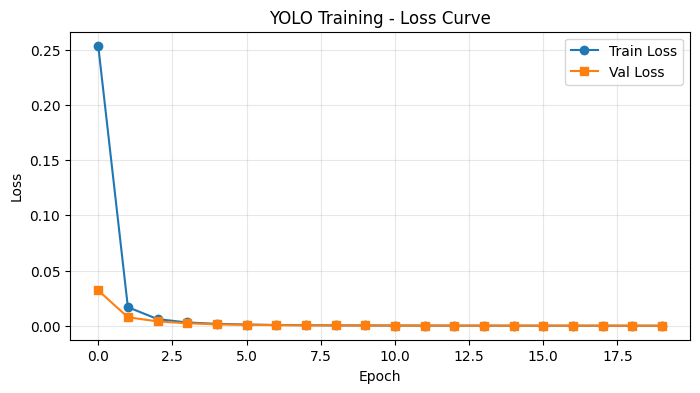

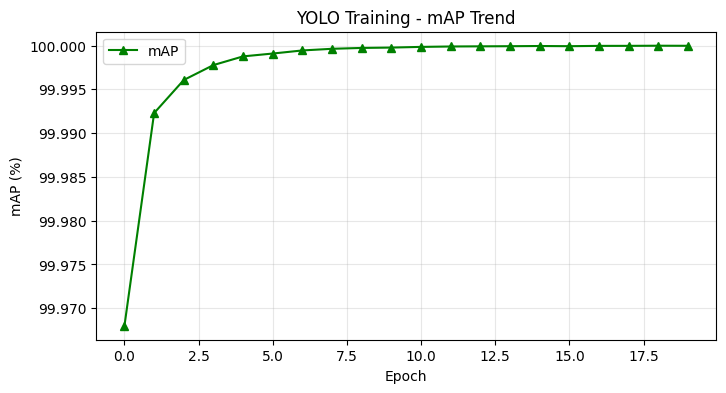

In [112]:
plot_yolo_training(train_losses, val_losses, ap_values)

In [129]:
# --- YOLO helpers: decode head -> boxes, then draw ---
import torch, torchvision, cv2, numpy as np, matplotlib.pyplot as plt

VOC_TINY_ANCHORS = [
    [(10,13),(16,30),(33,23)],   # head @ 13x13 (stride 32)
    [(30,61),(62,45),(59,119)]   # head @ 26x26 (stride 16)
]
VOC_TINY_STRIDES = [32, 16]

def decode_yolo_output(det, anchors, stride, num_classes, conf_thresh=0.35):
    """
    det: [B, A*(5+C), H, W] raw conv output (no activations applied)
    returns per-batch lists of (boxes[N,4], scores[N], cls_ids[N]) in input-pixel scale
    """
    B, _, H, W = det.shape
    A = len(anchors)

    # [B, A, 5+C, H, W] -> [B, A, H, W, 5+C]
    det = det.view(B, A, 5+num_classes, H, W).permute(0,1,3,4,2).contiguous()

    # grid (H,W,2)
    yy, xx = torch.meshgrid(torch.arange(H, device=det.device),
                            torch.arange(W, device=det.device), indexing="ij")
    grid = torch.stack((xx, yy), dim=-1)  # (H,W,2)

    # anchors (A,1,1,2)
    anc = torch.tensor(anchors, dtype=torch.float32, device=det.device).view(A,1,1,2)

    out_boxes, out_scores, out_cls = [], [], []
    for b in range(B):
        d = det[b]  # [A,H,W,5+C]

        tx = d[..., 0]; ty = d[..., 1]
        tw = d[..., 2]; th = d[..., 3]
        to = d[..., 4]
        tc = d[..., 5:]  # [A,H,W,C]

        # YOLO decode to input-pixel scale
        cx = (torch.sigmoid(tx) + grid[..., 0]) * stride   # [A,H,W]
        cy = (torch.sigmoid(ty) + grid[..., 1]) * stride
        pw = torch.exp(tw) * anc[..., 0]                   # [A,H,W]
        ph = torch.exp(th) * anc[..., 1]

        # objectness * best class prob
        obj = torch.sigmoid(to)
        cls_scores = torch.sigmoid(tc)                     # [A,H,W,C]
        cls_conf, cls_id = cls_scores.max(dim=-1)          # [A,H,W]
        score = obj * cls_conf

        mask = score > conf_thresh
        if mask.sum() == 0:
            out_boxes.append(torch.empty((0,4), device=det.device))
            out_scores.append(torch.empty((0,), device=det.device))
            out_cls.append(torch.empty((0,), dtype=torch.long, device=det.device))
            continue

        cx = cx[mask]; cy = cy[mask]; pw = pw[mask]; ph = ph[mask]
        x1 = cx - pw/2; y1 = cy - ph/2; x2 = cx + pw/2; y2 = cy + ph/2
        boxes = torch.stack([x1,y1,x2,y2], dim=1)

        out_boxes.append(boxes)
        out_scores.append(score[mask])
        out_cls.append(cls_id[mask].long())

    return out_boxes, out_scores, out_cls


def draw_boxes(img_rgb01, boxes, scores, cls_ids, class_names, max_det_draw=50):
    """
    Draw bounding boxes + labels clearly on an RGB [0..1] image.
    """
    img = (img_rgb01 * 255).astype(np.uint8).copy()
    N = min(len(boxes), max_det_draw)
    if N == 0:
        return img

    for i in range(N):
        x1, y1, x2, y2 = boxes[i].round().to(torch.int32).tolist()
        x1 = max(0, x1); y1 = max(0, y1)
        x2 = max(0, x2); y2 = max(0, y2)
        color = (0, 255, 0)

        # Draw rectangle
        cv2.rectangle(img, (x1, y1), (x2, y2), color, 2)

        # ---- Label text ----
        cls_name = class_names[int(cls_ids[i])] if int(cls_ids[i]) < len(class_names) else str(int(cls_ids[i]))
        score = float(scores[i])
        label = f"{cls_name}: {score:.2f}"

        # text size & background box
        (tw, th), _ = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.6, 2)
        th = int(th * 1.2)
        cv2.rectangle(img, (x1, y1 - th - 4), (x1 + tw + 2, y1), color, -1)

        # white text with black border for readability
        cv2.putText(img, label, (x1 + 1, y1 - 6),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 0, 0), 3, cv2.LINE_AA)
        cv2.putText(img, label, (x1 + 1, y1 - 6),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 255, 255), 1, cv2.LINE_AA)
    return img




import torch, torchvision, cv2, numpy as np, matplotlib.pyplot as plt

def show_yolo_predictions(model, dataloader, class_names, device,
                          num_images=6, conf_thresh=0.5, nms_thresh=0.45,
                          anchors=[[(10,13),(16,30),(33,23)], [(30,61),(62,45),(59,119)]],
                          strides=[32,16], max_det=20):
    """
    Show YOLOv3-Tiny predictions with clean boxes + single label per detection.
    """
    model.eval()
    shown = 0
    cols = 3
    rows = int(np.ceil(num_images / cols))
    plt.figure(figsize=(5*cols, 5.5*rows))

    with torch.no_grad():
        for imgs, _ in dataloader:
            imgs_t = torch.stack(imgs).to(device)
            preds = model(imgs_t)
            B = imgs_t.size(0)

            for b in range(B):
                if shown >= num_images:
                    plt.tight_layout(); plt.show(); return

                img_np = imgs_t[b].cpu().permute(1,2,0).numpy()
                img_np = np.clip(img_np, 0, 1)
                H_img, W_img = img_np.shape[:2]
                img_disp = (img_np*255).astype(np.uint8).copy()

                all_boxes, all_scores, all_cls = [], [], []

                # --- Decode each YOLO head ---
                for head_i, det in enumerate(preds):
                    boxes_b, scores_b, cls_b = decode_yolo_output(
                        det, anchors[head_i], strides[head_i], model.num_classes, conf_thresh
                    )
                    boxes_b, scores_b, cls_b = boxes_b[b], scores_b[b], cls_b[b]
                    if len(boxes_b) == 0:
                        continue
                    keep = torchvision.ops.nms(boxes_b, scores_b, nms_thresh)
                    all_boxes.append(boxes_b[keep])
                    all_scores.append(scores_b[keep])
                    all_cls.append(cls_b[keep])

                ax = plt.subplot(rows, cols, shown+1)
                ax.axis("off")

                if len(all_boxes) == 0:
                    ax.imshow(img_np)
                    ax.set_title("No detection", color="gray", fontsize=10)
                    shown += 1
                    continue

                boxes = torch.cat(all_boxes)
                scores = torch.cat(all_scores)
                cls_ids = torch.cat(all_cls)

                # Global NMS + keep top detections only
                keep = torchvision.ops.nms(boxes, scores, nms_thresh)
                boxes, scores, cls_ids = boxes[keep], scores[keep], cls_ids[keep]
                if len(boxes) > max_det:
                    topk = torch.topk(scores, k=max_det).indices
                    boxes, scores, cls_ids = boxes[topk], scores[topk], cls_ids[topk]

                # --- Draw final detections ---
                for (x1, y1, x2, y2), s, c in zip(boxes, scores, cls_ids):
                    if s < conf_thresh:  # skip weak
                        continue
                    x1, y1, x2, y2 = map(int, [x1, y1, x2, y2])
                    color = (0,255,0)
                    cv2.rectangle(img_disp, (x1,y1), (x2,y2), color, 2)
                    label = f"{class_names[int(c)]}: {s:.2f}"
                    (tw, th), _ = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.6, 2)
                    cv2.rectangle(img_disp, (x1, y1 - th - 4), (x1 + tw + 2, y1), color, -1)
                    cv2.putText(img_disp, label, (x1+1, y1-6),
                                cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0,0,0), 3, cv2.LINE_AA)
                    cv2.putText(img_disp, label, (x1+1, y1-6),
                                cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255,255,255), 1, cv2.LINE_AA)

                ax.imshow(cv2.cvtColor(img_disp, cv2.COLOR_BGR2RGB))

                # --- Clean summary text below image ---
                top_labels = [f"{class_names[int(c)]} ({s:.2f})"
                              for c, s in sorted(zip(cls_ids, scores),
                                                 key=lambda x: float(x[1]), reverse=True)[:5]]
                ax.set_title("\n".join(top_labels), fontsize=9, color="green")
                shown += 1

    plt.tight_layout(); plt.show()



In [104]:
import os, torch
from ultralytics import YOLO

def save_model(model, name="model", folder="saved_models"):
    """
    Save either a standard PyTorch model (state_dict) or an Ultralytics YOLO model (.pt)
    """
    os.makedirs(folder, exist_ok=True)
    path = os.path.join(folder, f"{name}.pt")

    if isinstance(model, YOLO):
        # ✅ Ultralytics YOLO model
        model.save(path)
        print(f"✅ Ultralytics YOLO model saved to {path}")
    else:
        # ✅ Regular PyTorch model
        torch.save(model.state_dict(), path)
        print(f"✅ PyTorch model saved to {path}")

    return path


def load_model(path, model_class=None, device=None):
    """
    Load a model from path — works for Ultralytics YOLO or PyTorch models.

    Args:
        path (str): Path to the saved .pt model
        model_class: (optional) PyTorch class for custom models (e.g., TinyYOLOv3)
        device: Torch device (default: auto-detect GPU)
    """
    device = device or ("cuda" if torch.cuda.is_available() else "cpu")

    # ✅ If it's an Ultralytics YOLO model
    if os.path.basename(path).startswith("yolo") or "runs/" in path:
        print(f"🔹 Loading Ultralytics YOLO model from {path}")
        model = YOLO(path)
        model.to(device)
        print("✅ YOLO model loaded successfully.")
        return model

    # ✅ Otherwise, assume a custom PyTorch model
    elif model_class is not None:
        print(f"🔹 Loading PyTorch model from {path}")
        model = model_class()
        model.load_state_dict(torch.load(path, map_location=device))
        model.to(device)
        print("✅ PyTorch model loaded successfully.")
        return model

    else:
        raise ValueError(
            "❌ model_class is required for loading custom PyTorch models (non-YOLO)."
        )


In [105]:
save_model(model, name="yolo_custom", folder="saved_models")

✅ PyTorch model saved to saved_models/yolo_custom.pt


'saved_models/yolo_custom.pt'

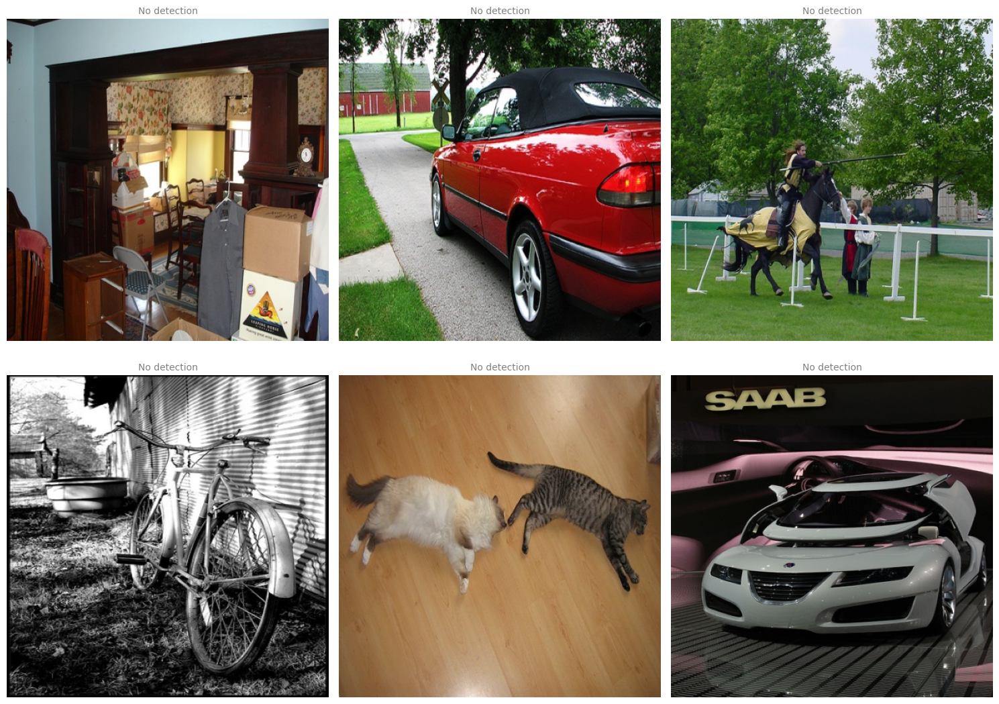

In [130]:
# model = YOLO("saved_models/yolo_custom.pt")
# model = load_model("saved_models/yolo_custom.pt")
show_yolo_predictions(model, valloader, class_names=VOC_CLASSES, device=device, num_images=6)


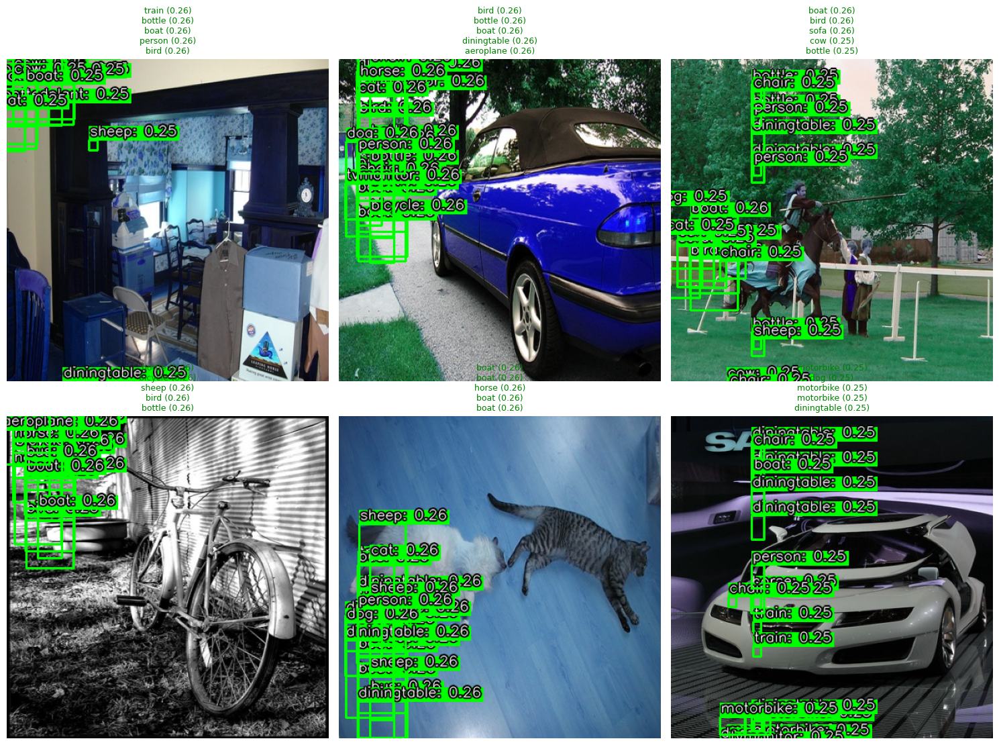

In [132]:
show_yolo_predictions(model, valloader, class_names=VOC_CLASSES,
                      device=device, num_images=6, conf_thresh=0.25, nms_thresh=0.45)


In [24]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 24.6 MB/s eta 0:00:00


In [25]:

# def save_model(model, name="model", folder="saved_models"):
#     os.makedirs(folder, exist_ok=True)
#     path = os.path.join(folder, f"{name}.pth")
#     torch.save(model.state_dict(), path)
#     print(f"✅ Model saved to {path}")

# def load_model(model_class, name="model", folder="saved_models", map_location=None):
#     path = os.path.join(folder, f"{name}.pth")
#     model = model_class()
#     model.load_state_dict(torch.load(path, map_location=map_location or device))
#     model.to(device)
#     print(f"✅ Model loaded from {path}")
#     return model

In [27]:
# def save_yolo_model(model,path="yolov3_custom_voc2012.pt"):
#     torch.save(model.state_dict(),path); print(f"✅ Saved to {path}")
# def load_yolo_model(model_class,path,num_classes,device):
#     m=model_class(num_classes=num_classes)
#     m.load_state_dict(torch.load(path,map_location=device))
#     m.to(device).eval(); print(f"✅ Loaded from {path}"); return m

save_model(model,name="yolov3_custom_voc2007.pt")


✅ PyTorch model saved to saved_models/yolov3_custom_voc2007.pt.pt


'saved_models/yolov3_custom_voc2007.pt.pt'

## Exercise 2 ultralytic

In [28]:
from ultralytics import YOLO
import os, yaml
import matplotlib.pyplot as plt

In [29]:
!apt-get install tree
!tree -f -L 3 /content/DLCV_Lab_Dataset/

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
tree is already the newest version (2.0.2-1).
0 upgraded, 0 newly installed, 0 to remove and 41 not upgraded.
/content/DLCV_Lab_Dataset
├── /content/DLCV_Lab_Dataset/pascal_voc
│   └── /content/DLCV_Lab_Dataset/pascal_voc/PASCAL_VOC
│       ├── /content/DLCV_Lab_Dataset/pascal_voc/PASCAL_VOC/pascal_test2007.json
│       ├── /content/DLCV_Lab_Dataset/pascal_voc/PASCAL_VOC/pascal_train2007.json
│       ├── /content/DLCV_Lab_Dataset/pascal_voc/PASCAL_VOC/pascal_train2012.json
│       ├── /content/DLCV_Lab_Dataset/pascal_voc/PASCAL_VOC/pascal_val2007.json
│       └── /content/DLCV_Lab_Dataset/pascal_voc/PASCAL_VOC/pascal_val2012.json
├── /content/DLCV_Lab_Dataset/PASCAL_VOC
│   └── /content/DLCV_Lab_Dataset/PASCAL_VOC/PASCAL_VOC
│       ├── /content/DLCV_Lab_Dataset/PASCAL_VOC/PASCAL_VOC/pascal_test2007.json
│       ├── /content/DLCV_Lab_Dataset/PASCAL_VOC/PASCAL_VOC/pascal_train2007.json
│    

In [30]:
!tree -f -L 2 /content/DLCV_Lab_Dataset/VOC2012_train_val

/content/DLCV_Lab_Dataset/VOC2012_train_val  [error opening dir]

0 directories, 0 files


In [31]:
import os
from pathlib import Path

# Source Pascal VOC 2007 roots
trainval_root = "/content/DLCV_Lab_Dataset/VOCtrainval_06-Nov-2007/VOCdevkit/VOC2007"
test_root = "/content/DLCV_Lab_Dataset/VOCtest_06-Nov-2007/VOCdevkit/VOC2007"

# Output root for YOLOv11 dataset
yolo_root = "/content/DLCV_Lab_Dataset/VOC2007_yolo"
Path(yolo_root).mkdir(parents=True, exist_ok=True)
print(f"✅ YOLO output directory: {yolo_root}")


✅ YOLO output directory: /content/DLCV_Lab_Dataset/VOC2007_yolo


In [32]:
VOC_CLASSES = [
    "aeroplane", "bicycle", "bird", "boat", "bottle",
    "bus", "car", "cat", "chair", "cow", "diningtable",
    "dog", "horse", "motorbike", "person", "pottedplant",
    "sheep", "sofa", "train", "tvmonitor"
]
CLASS_TO_ID = {cls: i for i, cls in enumerate(VOC_CLASSES)}


In [33]:
def read_split_list(voc_root, split_name):
    path = os.path.join(voc_root, "ImageSets/Main", f"{split_name}.txt")
    with open(path, "r") as f:
        ids = [x.strip() for x in f.readlines() if x.strip()]
    return ids

train_ids = read_split_list(trainval_root, "train")
val_ids = read_split_list(trainval_root, "val")

print(f"📊 Found {len(train_ids)} train and {len(val_ids)} val IDs")


📊 Found 2501 train and 2510 val IDs


In [34]:
for split in ["train", "val", "test"]:
    for sub in ["images", "labels"]:
        Path(os.path.join(yolo_root, sub, split)).mkdir(parents=True, exist_ok=True)
print("📁 Created YOLO folder structure.")


📁 Created YOLO folder structure.


In [35]:
import xml.etree.ElementTree as ET
import shutil
from tqdm import tqdm

def voc_to_yolo(xml_path, txt_path, class_map):
    tree = ET.parse(xml_path)
    root = tree.getroot()
    w = int(root.find("size/width").text)
    h = int(root.find("size/height").text)
    lines = []
    for obj in root.findall("object"):
        cls_name = obj.find("name").text
        if cls_name not in class_map:
            continue
        cls_id = class_map[cls_name]
        box = obj.find("bndbox")
        xmin = float(box.find("xmin").text)
        ymin = float(box.find("ymin").text)
        xmax = float(box.find("xmax").text)
        ymax = float(box.find("ymax").text)
        x_center = ((xmin + xmax) / 2.0) / w
        y_center = ((ymin + ymax) / 2.0) / h
        width = (xmax - xmin) / w
        height = (ymax - ymin) / h
        lines.append(f"{cls_id} {x_center:.6f} {y_center:.6f} {width:.6f} {height:.6f}")
    if lines:
        with open(txt_path, "w") as f:
            f.write("\n".join(lines))


In [36]:
def process_split(ids, split_name, voc_root, yolo_root):
    img_src = os.path.join(voc_root, "JPEGImages")
    xml_src = os.path.join(voc_root, "Annotations")
    img_dst = os.path.join(yolo_root, "images", split_name)
    lbl_dst = os.path.join(yolo_root, "labels", split_name)

    for img_id in tqdm(ids, desc=f"Processing {split_name}"):
        src_img = os.path.join(img_src, img_id + ".jpg")
        src_xml = os.path.join(xml_src, img_id + ".xml")
        dst_img = os.path.join(img_dst, img_id + ".jpg")
        dst_lbl = os.path.join(lbl_dst, img_id + ".txt")

        if os.path.exists(src_img):
            shutil.copy(src_img, dst_img)
        if os.path.exists(src_xml):
            voc_to_yolo(src_xml, dst_lbl, CLASS_TO_ID)


In [37]:
process_split(train_ids, "train", trainval_root, yolo_root)
process_split(val_ids, "val", trainval_root, yolo_root)


Processing val: 100%|██████████| 2510/2510 [00:01<00:00, 1296.06it/s]


In [38]:
def process_test(voc_root, yolo_root):
    img_src = os.path.join(voc_root, "JPEGImages")
    xml_src = os.path.join(voc_root, "Annotations")
    img_dst = os.path.join(yolo_root, "images", "test")
    lbl_dst = os.path.join(yolo_root, "labels", "test")

    for xml in tqdm(os.listdir(xml_src), desc="Processing test"):
        if not xml.endswith(".xml"):
            continue
        img_id = os.path.splitext(xml)[0]
        src_img = os.path.join(img_src, img_id + ".jpg")
        src_xml = os.path.join(xml_src, xml)
        dst_img = os.path.join(img_dst, img_id + ".jpg")
        dst_lbl = os.path.join(lbl_dst, img_id + ".txt")
        if os.path.exists(src_img):
            shutil.copy(src_img, dst_img)
        voc_to_yolo(src_xml, dst_lbl, CLASS_TO_ID)

process_test(test_root, yolo_root)
print("✅ Test set processed and converted.")


Processing test: 100%|██████████| 4952/4952 [00:06<00:00, 755.09it/s]

✅ Test set processed and converted.


In [39]:
for split in ["train", "val", "test"]:
    imgs = len(os.listdir(os.path.join(yolo_root, "images", split)))
    lbls = len(os.listdir(os.path.join(yolo_root, "labels", split)))
    print(f"{split.upper():<5}: {imgs:>5} images, {lbls:>5} labels")


TRAIN:  2501 images,  2501 labels
VAL  :  2510 images,  2510 labels
TEST :  4952 images,  4952 labels


In [40]:
import yaml

yaml_dict = {
    "train": os.path.join(yolo_root, "images/train"),
    "val": os.path.join(yolo_root, "images/val"),
    "test": os.path.join(yolo_root, "images/test"),
    "nc": len(VOC_CLASSES),
    "names": VOC_CLASSES
}

yaml_path = os.path.join(yolo_root, "voc2007.yaml")
with open(yaml_path, "w") as f:
    yaml.dump(yaml_dict, f)
print(f"✅ Dataset YAML created at: {yaml_path}")


✅ Dataset YAML created at: /content/DLCV_Lab_Dataset/VOC2007_yolo/voc2007.yaml


In [41]:
for split in ["train", "val", "test"]:
    imgs = len(os.listdir(os.path.join(yolo_root, "images", split)))
    lbls = len(os.listdir(os.path.join(yolo_root, "labels", split)))
    print(f"{split.upper():<5}: {imgs:>5} images, {lbls:>5} labels")


TRAIN:  2501 images,  2501 labels
VAL  :  2510 images,  2510 labels
TEST :  4952 images,  4952 labels


In [42]:
!pip install ultralytics

In [43]:
from ultralytics import YOLO

model = YOLO("yolo11n.pt")  # or yolo11n-seg.pt if segmentation
model.train(
    data=yaml_path,
    epochs=50,
    imgsz=640,
    batch=16,
    device=0 if torch.cuda.is_available() else 'cpu'
)


Ultralytics 8.3.224 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/DLCV_Lab_Dataset/VOC2007_yolo/voc2007.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7d56765a55b0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043

In [44]:
import matplotlib.pyplot as plt
from pathlib import Path

def plot_yolo_training_curves(run_dir):
    """
    Plot YOLO training losses and AP curves from results.csv or results.png.
    """
    run_dir = Path(run_dir)
    results_csv = run_dir / "results.csv"
    results_png = run_dir / "results.png"

    # YOLO already generates results.png automatically
    if results_png.exists():
        from IPython.display import Image
        display(Image(filename=results_png, width=800))
        print("✅ Displayed Ultralytics built-in training summary.")
    elif results_csv.exists():
        import pandas as pd
        df = pd.read_csv(results_csv)
        # Plot Loss curves
        plt.figure(figsize=(8,5))
        plt.plot(df["train/box_loss"], label="Box Loss")
        plt.plot(df["train/cls_loss"], label="Cls Loss")
        plt.plot(df["val/box_loss"], label="Val Box Loss")
        plt.xlabel("Epoch")
        plt.ylabel("Loss")
        plt.title("Training and Validation Loss")
        plt.legend()
        plt.show()

        # Plot mAP
        plt.figure(figsize=(8,5))
        plt.plot(df["metrics/mAP50"], label="mAP@0.5")
        plt.plot(df["metrics/mAP50-95"], label="mAP@0.5:0.95")
        plt.xlabel("Epoch")
        plt.ylabel("mAP")
        plt.title("Mean Average Precision (Validation)")
        plt.legend()
        plt.show()
    else:
        print("⚠️ No results.csv or results.png found in", run_dir)


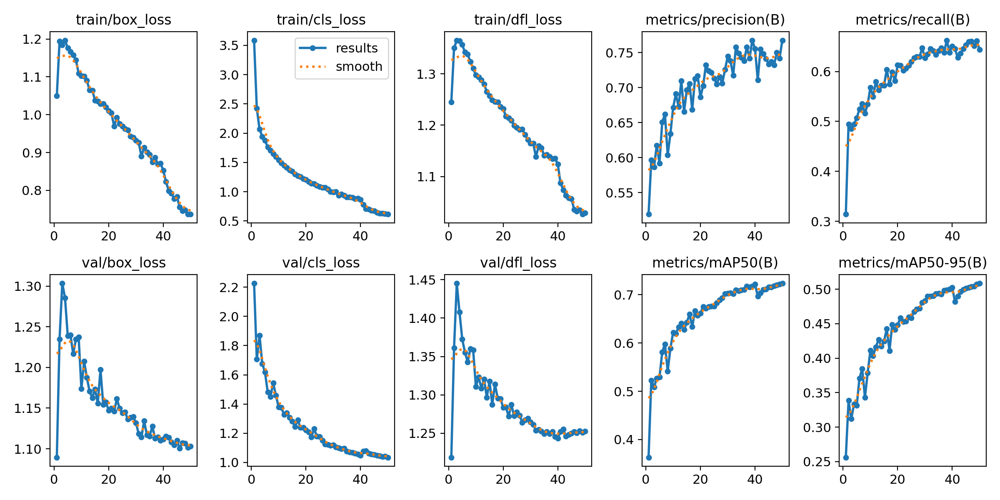

✅ Displayed Ultralytics built-in training summary.


In [45]:
plot_yolo_training_curves("/content/runs/detect/train")


In [46]:
save_model(model, name="voc2007_yolov11n", folder="saved_models")

✅ Ultralytics YOLO model saved to saved_models/voc2007_yolov11n.pt


'saved_models/voc2007_yolov11n.pt'

In [47]:
import matplotlib.pyplot as plt
import cv2
from pathlib import Path
from ultralytics import YOLO

def plot_yolo_test_predictions(model_path, test_dir, conf=0.25, num_images=5, save_dir="/content/yolo_test_results"):
    """
    Run inference on a few test images and display annotated predictions inline.

    Args:
        model_path (str): Path to trained YOLO model (e.g., best.pt)
        test_dir (str): Path to test image directory
        conf (float): Confidence threshold for predictions
        num_images (int): Number of random test images to visualize
        save_dir (str): Directory where annotated images will be saved
    """
    import random
    model = YOLO(model_path)
    test_dir = Path(test_dir)

    # Pick random sample images
    imgs = sorted(test_dir.glob("*.jpg"))
    if len(imgs) == 0:
        raise FileNotFoundError(f"No test images found in {test_dir}")
    sample_imgs = random.sample(imgs, min(num_images, len(imgs)))

    # Run predictions
    results = model.predict(source=sample_imgs, conf=conf, save=True, project=save_dir)
    print(f"✅ Predictions saved at: {results[0].save_dir}")

    # Display inline
    fig, axes = plt.subplots(1, len(sample_imgs), figsize=(20, 6))
    if len(sample_imgs) == 1:
        axes = [axes]
    for ax, img_path in zip(axes, sample_imgs):
        out_path = Path(results[0].save_dir) / img_path.name
        img = cv2.cvtColor(cv2.imread(str(out_path)), cv2.COLOR_BGR2RGB)
        ax.imshow(img)
        ax.set_title(img_path.name)
        ax.axis("off")
    plt.show()



0: 640x640 1 bicycle, 1 motorbike, 1 person, 12.6ms
1: 640x640 2 trains, 12.6ms
2: 640x640 1 chair, 1 sofa, 12.6ms
3: 640x640 2 bicycles, 2 persons, 12.6ms
Speed: 2.8ms preprocess, 12.6ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)
Results saved to /content/yolo_test_results/predict
✅ Predictions saved at: /content/yolo_test_results/predict


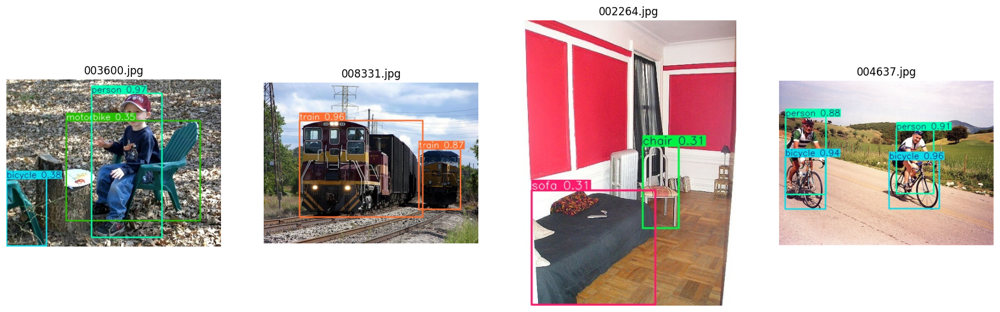

In [48]:
plot_yolo_test_predictions(
    # model_path="/content/yolo_results/voc2012_dynamic/weights/best.pt",
    model_path="/content/saved_models/voc2007_yolov11n.pt",
    test_dir="/content/DLCV_Lab_Dataset/VOC2007_yolo/images/test",
    conf=0.25,
    num_images=4
)


In [49]:
# evaluate_ultra_yolo(model, yaml_path)
metrics = model.val()
print(metrics)


Ultralytics 8.3.224 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,586,052 parameters, 0 gradients, 6.3 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1836.3±238.9 MB/s, size: 106.1 KB)
val: Scanning /content/DLCV_Lab_Dataset/VOC2007_yolo/labels/val.cache... 2510 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 2510/2510 4.0Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 157/157 4.9it/s 31.9s
                   all       2510       7818      0.768      0.644      0.724      0.508
             aeroplane        127        175      0.821      0.789       0.86      0.609
               bicycle        133        216      0.769      0.664      0.758      0.548
                  bird        151        305       0.77      0.518      0.614      0.387
                  boat        101        190      0.729      0.489      0.593      0.355
                bott

In [50]:
import torch
import matplotlib.pyplot as plt
from ultralytics import YOLO
import cv2
import numpy as np
import os

def test_ultra_yolo(model, img_paths, device="cuda", conf=0.25, num_images=6, cols=3):
    """
    Test YOLO (Ultralytics) model on multiple images and plot predictions.

    Args:
        model: YOLO model (from ultralytics import YOLO)
        img_paths: list of image paths or a directory
        device: 'cuda', 'cpu', or int (e.g. 0)
        conf: confidence threshold (float)
        num_images: number of images to display
        cols: number of columns in the subplot grid
    """
    # Resolve device automatically
    if isinstance(device, str):
        if device == "cuda" and not torch.cuda.is_available():
            print("⚠️ CUDA not available, switching to CPU.")
            device = "cpu"

    # handle single path / folder / list
    if isinstance(img_paths, str) and os.path.isdir(img_paths):
        all_imgs = [os.path.join(img_paths, f) for f in os.listdir(img_paths)
                    if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    elif isinstance(img_paths, (list, tuple)):
        all_imgs = img_paths
    else:
        all_imgs = [img_paths]

    imgs_to_show = all_imgs[:num_images]

    # run inference
    results = model.predict(source=imgs_to_show, conf=conf, device=device, verbose=False)

    # plotting grid
    rows = int(np.ceil(len(imgs_to_show) / cols))
    plt.figure(figsize=(5*cols, 5*rows))

    for i, r in enumerate(results):
        annotated = r.plot()  # YOLO built-in visualization (with labels)
        annotated = cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB)

        ax = plt.subplot(rows, cols, i + 1)
        ax.imshow(annotated)
        ax.axis("off")

        # summary text
        if len(r.boxes) > 0:
            labels_conf = [
                f"{r.names[int(c)]} ({float(s):.2f})"
                for c, s in zip(r.boxes.cls, r.boxes.conf)
            ]
            summary = "\n".join(labels_conf[:5])
            ax.set_title(summary, fontsize=9, color="green")
        else:
            ax.set_title("No detection", color="gray", fontsize=9)

    plt.tight_layout()
    plt.show()

    return results


In [51]:
import pandas as pd

def plot_ultra_yolo_loss(results_dir="runs/detect/train_run"):
    """
    Plot Ultralytics YOLO training loss curves from results.csv
    """
    csv_path = os.path.join(results_dir, "results.csv")
    if not os.path.exists(csv_path):
        print("⚠️ results.csv not found — check your YOLO training run folder.")
        return

    df = pd.read_csv(csv_path)
    plt.figure(figsize=(8,5))
    plt.plot(df["epoch"], df["train/box_loss"], label="Box Loss")
    plt.plot(df["epoch"], df["train/cls_loss"], label="Class Loss")
    plt.plot(df["epoch"], df["train/dfl_loss"], label="DFL Loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title("Ultralytics YOLO Training Losses")
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.show()


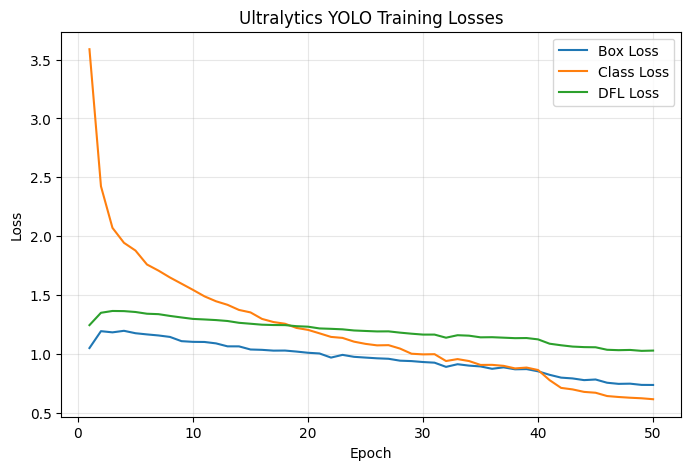

In [52]:
plot_ultra_yolo_loss("/content/runs/detect/train")


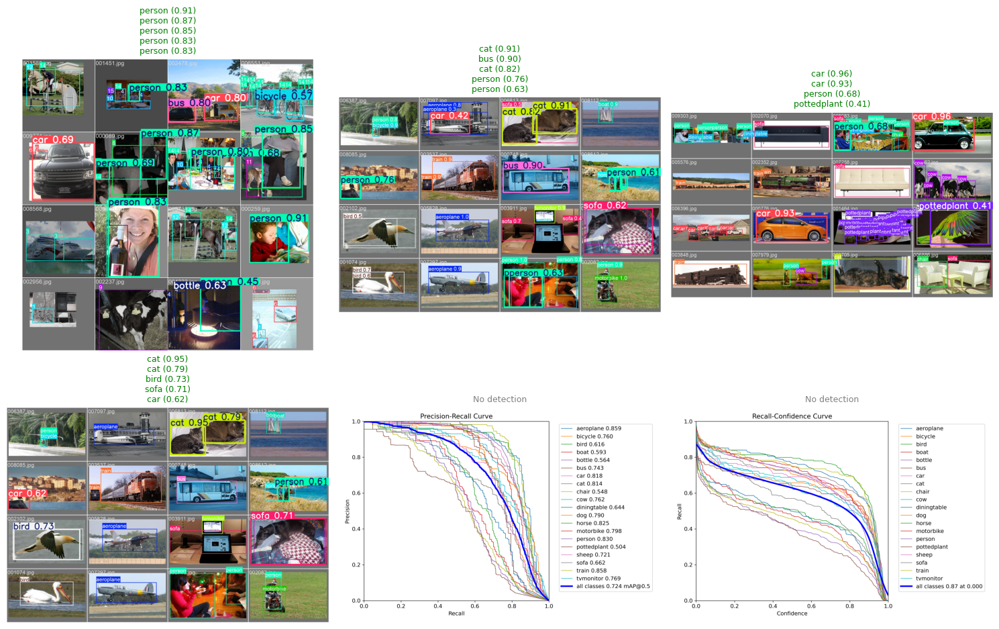

In [53]:
results = test_ultra_yolo(model, "/content/runs/detect/train", device="cuda", conf=0.4, num_images=6)


In [54]:
# results = test_ultra_yolo(model, "data/test.jpg", device="cuda", conf=0.4)


## Exercise 3 Ultratytic with Body part dataset:

In [55]:
raw_zip_dir = "DLCV_Lab_Dataset/raw_zips/body-parts-dataset.zip"
source_url = "https://www.kaggle.com/api/v1/datasets/download/linkanjarad/body-parts-dataset"
download_big_file(raw_zip_dir, source_url)

body-parts-dataset.zip: 100%|██████████| 6.56M/6.56M [00:00<00:00, 39.0MB/s]


In [56]:
zip_path = "DLCV_Lab_Dataset/raw_zips/body-parts-dataset.zip"
extract_path = "DLCV_Lab_Dataset"
unzip_folder(zip_path, extract_path,sub_dir="body-parts-dataset")

📦 Extracting body-parts-dataset.zip → DLCV_Lab_Dataset


Extracting: 100%|██████████| 2092/2092 [00:00<00:00, 9262.46file/s]


In [57]:
!rm -rf /content/data/body_parts_split

In [58]:
import os, random, shutil

def prepare_classification_split(src_dir, dest_dir="/content/data/body_parts_split", val_ratio=0.2, test_ratio=0.1):
    """
    Split a classification dataset into train, val, and test sets.
    Each class folder is split proportionally.

    Args:
        src_dir (str): Source directory containing class folders (e.g., belly/, ears/, etc.)
        dest_dir (str): Destination root for split dataset
        val_ratio (float): Fraction of images to use for validation
        test_ratio (float): Fraction of images to use for testing
    Returns:
        (train_dir, val_dir, test_dir)
    """
    assert val_ratio + test_ratio < 1.0, "val_ratio + test_ratio must be < 1"

    classes = [c for c in os.listdir(src_dir) if os.path.isdir(os.path.join(src_dir, c))]
    os.makedirs(dest_dir, exist_ok=True)

    train_dir = os.path.join(dest_dir, "train")
    val_dir = os.path.join(dest_dir, "val")
    test_dir = os.path.join(dest_dir, "test")

    # Create directories
    for d in [train_dir, val_dir, test_dir]:
        for c in classes:
            os.makedirs(os.path.join(d, c), exist_ok=True)

    # Split and copy files
    for c in classes:
        class_path = os.path.join(src_dir, c)
        imgs = [f for f in os.listdir(class_path) if f.lower().endswith((".jpg", ".jpeg", ".png"))]
        random.shuffle(imgs)

        n_total = len(imgs)
        n_val = int(n_total * val_ratio)
        n_test = int(n_total * test_ratio)
        n_train = n_total - n_val - n_test

        val_imgs = imgs[:n_val]
        test_imgs = imgs[n_val:n_val+n_test]
        train_imgs = imgs[n_val+n_test:]

        for img_list, out_dir in zip([train_imgs, val_imgs, test_imgs], [train_dir, val_dir, test_dir]):
            for img in img_list:
                src_path = os.path.join(class_path, img)
                dst_path = os.path.join(out_dir, c, img)
                shutil.copy(src_path, dst_path)

        print(f"📂 {c}: {n_train} train, {n_val} val, {n_test} test")

    print(f"\n✅ Split complete!")
    print(f"Train: {train_dir}\nVal:   {val_dir}\nTest:  {test_dir}")
    return train_dir, val_dir, test_dir





In [59]:
src_dir = "/content/DLCV_Lab_Dataset/Body Parts Dataset"
train_dir, val_dir, test_dir = prepare_classification_split(src_dir)

📂 Shoulders: 147 train, 42 val, 21 test
📂 Elbow: 145 train, 41 val, 20 test
📂 Hand: 153 train, 43 val, 21 test
📂 Ear: 145 train, 41 val, 20 test
📂 Eye: 151 train, 43 val, 21 test
📂 Knee: 145 train, 41 val, 20 test
📂 Foot: 147 train, 42 val, 21 test
📂 Neck: 145 train, 41 val, 20 test
📂 Belly: 147 train, 41 val, 20 test
📂 Nose: 147 train, 41 val, 20 test

✅ Split complete!
Train: /content/data/body_parts_split/train
Val:   /content/data/body_parts_split/val
Test:  /content/data/body_parts_split/test


In [60]:
print(train_dir)
print(val_dir)

/content/data/body_parts_split/train
/content/data/body_parts_split/val


## For Ultralytic Yolo classification model

In [61]:
from ultralytics import YOLO

model = YOLO("yolov8n-cls.pt")  # you can also try yolov8m-cls.pt or yolov9e-cls.pt

root_dir = "/content/data/body_parts_split"
model.train(
    data=root_dir,    # folder with subfolders as class names
    epochs=30,
    imgsz=224,         # image size
    batch=16,
    lr0=0.001,
    project="YOLO_BodyParts",
    name="cls_train_run",
    device=0 if torch.cuda.is_available() else "cpu"
)


Ultralytics 8.3.224 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/data/body_parts_split, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=30, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=224, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n-cls.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=cls_train_run, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=

ultralytics.utils.metrics.ClassifyMetrics object with attributes:

confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7d566b720fe0>
curves: []
curves_results: []
fitness: 0.8629807829856873
keys: ['metrics/accuracy_top1', 'metrics/accuracy_top5']
results_dict: {'metrics/accuracy_top1': 0.7668269276618958, 'metrics/accuracy_top5': 0.9591346383094788, 'fitness': 0.8629807829856873}
save_dir: PosixPath('/content/YOLO_BodyParts/cls_train_run')
speed: {'preprocess': 0.2922188125073542, 'inference': 0.8299442475976531, 'loss': 0.00032169230315468245, 'postprocess': 0.0006169110607655826}
task: 'classify'
top1: 0.7668269276618958
top5: 0.9591346383094788

In [62]:
metrics = model.val()
print(metrics)


Ultralytics 8.3.224 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8n-cls summary (fused): 30 layers, 1,447,690 parameters, 0 gradients, 3.3 GFLOPs
train: /content/data/body_parts_split/train... found 1472 images in 10 classes ✅ 
val: /content/data/body_parts_split/val... found 416 images in 10 classes ✅ 
test: /content/data/body_parts_split/test... found 204 images in 10 classes ✅ 
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 112.6±43.0 MB/s, size: 3.0 KB)
val: Scanning /content/data/body_parts_split/val... 416 images, 0 corrupt: 100% ━━━━━━━━━━━━ 416/416 759.3Kit/s 0.0s
               classes   top1_acc   top5_acc: 100% ━━━━━━━━━━━━ 26/26 18.8it/s 1.4s
                   all      0.767      0.962
Speed: 0.3ms preprocess, 1.5ms inference, 0.0ms loss, 0.0ms postprocess per image
Results saved to /content/runs/classify/val
ultralytics.utils.metrics.ClassifyMetrics object with attributes:

confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x

In [63]:
results = model.predict(source="/content/DLCV_Lab_Dataset/Body Parts Dataset/Ear/Ear_1.jpg", show=True)


WARNING ⚠️ Environment does not support cv2.imshow() or PIL Image.show()


image 1/1 /content/DLCV_Lab_Dataset/Body Parts Dataset/Ear/Ear_1.jpg: 224x224 Ear 1.00, Neck 0.00, Nose 0.00, Belly 0.00, Eye 0.00, 2.3ms
Speed: 2.7ms preprocess, 2.3ms inference, 0.1ms postprocess per image at shape (1, 3, 224, 224)


In [64]:
import pandas as pd
import matplotlib.pyplot as plt
import os

def plot_ultra_yolo_cls_loss(results_dir="runs/classify/cls_train_run"):
    csv_path = os.path.join(results_dir, "results.csv")
    if not os.path.exists(csv_path):
        print("⚠️ results.csv not found — check your run folder.")
        return

    df = pd.read_csv(csv_path)
    plt.figure(figsize=(8,5))
    plt.plot(df["epoch"], df["train/loss"], label="Train Loss", marker='o')
    plt.plot(df["epoch"], df["val/loss"], label="Val Loss", marker='s')
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title("YOLO Classification Loss")
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.legend()
    plt.show()

plot_ultra_yolo_cls_loss("runs/classify/cls_train_run")


⚠️ results.csv not found — check your run folder.


In [65]:
import os
import matplotlib.pyplot as plt
import cv2
from ultralytics import YOLO

def test_yolo_classification_model(model, test_dir, num_images=9, conf=0.25, device="cuda"):
    """
    Evaluate and visualize YOLO classification model on a test set.

    Args:
        model: Trained YOLO classification model (YOLO object)
        test_dir (str): Path to test dataset folder
        num_images (int): Number of sample images to visualize
        conf (float): Confidence threshold for predictions
        device (str): 'cuda' or 'cpu'
    """
    # Run validation/testing
    print(f"🚀 Running test on: {test_dir}")
    metrics = model.val(data=test_dir, device=device, split="test", conf=conf)
    print("✅ Evaluation complete.")
    print(metrics.results_dict)

    # Collect test image paths
    img_paths = []
    for root, _, files in os.walk(test_dir):
        for f in files:
            if f.lower().endswith((".jpg", ".jpeg", ".png")):
                img_paths.append(os.path.join(root, f))
    img_paths = sorted(img_paths)

    if len(img_paths) == 0:
        print("⚠️ No images found in test directory.")
        return

    # Run predictions
    results = model.predict(source=img_paths[:num_images], conf=conf, device=device, verbose=False)

    # Plot results
    cols = 3
    rows = int((num_images + cols - 1) / cols)
    plt.figure(figsize=(5 * cols, 5 * rows))

    for i, (path, res) in enumerate(zip(img_paths[:num_images], results)):
        img = cv2.imread(path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        pred_id = int(res.probs.top1)
        pred_label = res.names[pred_id]
        conf_score = float(res.probs.top1conf)

        ax = plt.subplot(rows, cols, i + 1)
        ax.imshow(img)
        ax.axis("off")
        ax.set_title(f"#{i+1}\n{pred_label} ({conf_score:.2f})", color="green")

    plt.tight_layout()
    plt.show()


🚀 Running test on: /content/data/body_parts_split/test
Ultralytics 8.3.224 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
WARNING ⚠️ Dataset 'split=train' not found at /content/data/body_parts_split/test/train
Found 204 images in subdirectories. Attempting to split...
Splitting /content/data/body_parts_split/test (10 classes, 204 images) into 80% train, 20% val...
Split complete in /content/data/body_parts_split/test_split ✅
WARNING ⚠️ Dataset 'split=test' not found, using 'split=val' instead.
train: /content/data/body_parts_split/test_split/train... found 160 images in 10 classes ✅ 
val: /content/data/body_parts_split/test_split/val... found 44 images in 10 classes ✅ 
test: /content/data/body_parts_split/test_split/val... found 44 images in 10 classes ✅ 
test: Fast image access ✅ (ping: 0.0±0.1 ms, read: 92.8±32.7 MB/s, size: 3.0 KB)
test: Scanning /content/data/body_parts_split/test_split/val... 44 images, 0 corrupt: 100% ━━━━━━━━━━━━ 44/44 4.9Kit/s 0.0s
test: New cac

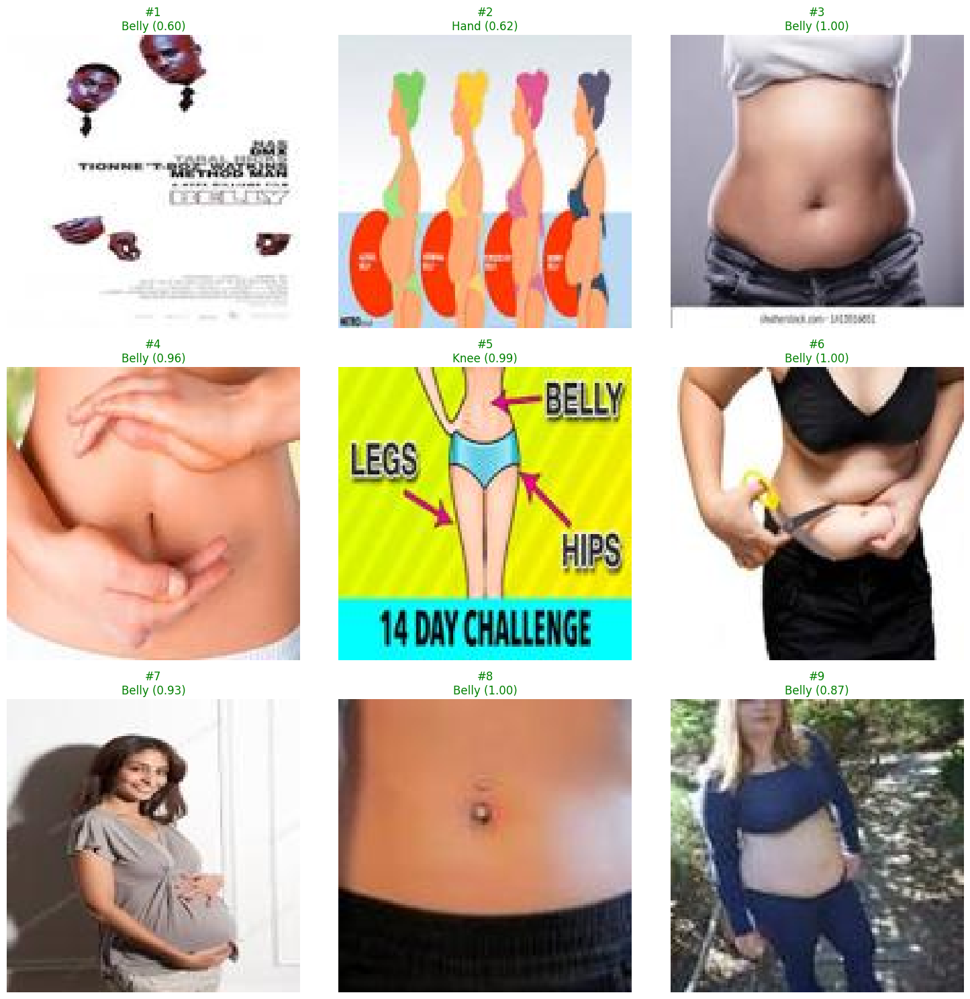

In [66]:
from ultralytics import YOLO

# Load your trained YOLOv8 classification model
# model = YOLO("runs/classify/train/weights/best.pt")

# Path to test set (created by prepare_classification_split)
test_dir = "/content/data/body_parts_split/test"

# Evaluate and show predictions
test_yolo_classification_model(model, test_dir, num_images=9)


In [67]:
save_model(name="ultra_yolo_cls", model=model)

✅ Ultralytics YOLO model saved to saved_models/ultra_yolo_cls.pt


'saved_models/ultra_yolo_cls.pt'

## For Ultralytic Yolo detection model

In [68]:
from ultralytics import YOLO

# Load detection model (not classification)
model = YOLO("yolov8n.pt")  # or yolov8s.pt for higher accuracy


In [69]:
# !rm -rf /content/data/body_parts_split

In [70]:
import cv2, numpy as np
from tqdm import tqdm

def generate_pseudo_yolo_labels(root_dir, out_root="body_parts_yolo"):
    """
    Generate YOLO-style pseudo bounding boxes from a folder-based classification dataset.
    One bounding box per image (based on largest contour).
    """
    for split in ["train", "val", "test"]:
        img_split = os.path.join(root_dir, split)
        out_img_dir = os.path.join(out_root, "images", split)
        out_lbl_dir = os.path.join(out_root, "labels", split)
        os.makedirs(out_img_dir, exist_ok=True)
        os.makedirs(out_lbl_dir, exist_ok=True)

        class_names = sorted(os.listdir(img_split))
        class_to_id = {c: i for i, c in enumerate(class_names)}

        for cls in class_names:
            class_dir = os.path.join(img_split, cls)
            imgs = [f for f in os.listdir(class_dir) if f.lower().endswith((".jpg", ".jpeg", ".png"))]

            for f in tqdm(imgs, desc=f"{split}/{cls}"):
                img_path = os.path.join(class_dir, f)
                img = cv2.imread(img_path)
                if img is None:
                    continue

                H, W = img.shape[:2]
                gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
                blur = cv2.GaussianBlur(gray, (5, 5), 0)
                _, thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

                contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
                if not contours:
                    x, y, w, h = 0, 0, W, H
                else:
                    x, y, w, h = cv2.boundingRect(max(contours, key=cv2.contourArea))

                x_center, y_center = (x + w/2)/W, (y + h/2)/H
                w_norm, h_norm = w/W, h/H

                label_path = os.path.join(out_lbl_dir, f.rsplit('.', 1)[0] + ".txt")
                cls_id = class_to_id[cls]
                with open(label_path, "w") as lf:
                    lf.write(f"{cls_id} {x_center:.6f} {y_center:.6f} {w_norm:.6f} {h_norm:.6f}\n")

                cv2.imwrite(os.path.join(out_img_dir, f), img)

    print(f"✅ YOLO pseudo-labels generated at: {out_root}")
    return out_root


In [71]:
pseudo_root = generate_pseudo_yolo_labels("/content/data/body_parts_split")


test/Shoulders: 100%|██████████| 21/21 [00:00<00:00, 1730.60it/s]

✅ YOLO pseudo-labels generated at: body_parts_yolo


In [72]:
import os, yaml

def create_yolo_yaml(out_root, class_names):
    out_root = os.path.abspath(out_root)  # 👈 make it absolute
    yaml_dict = {
        "train": os.path.join(out_root, "images/train"),
        "val": os.path.join(out_root, "images/val"),
        "test": os.path.join(out_root, "images/test"),
        "nc": len(class_names),
        "names": class_names
    }
    yaml_path = os.path.join(out_root, "body_parts.yaml")
    with open(yaml_path, "w") as f:
        yaml.dump(yaml_dict, f)
    print(f"✅ YAML created at: {yaml_path}")
    return yaml_path



In [73]:
class_names = sorted(os.listdir("/content/data/body_parts_split/train"))
yaml_path = create_yolo_yaml("/content/body_parts_yolo", class_names)


✅ YAML created at: /content/body_parts_yolo/body_parts.yaml


In [74]:
!cat /content/body_parts_yolo/body_parts.yaml

names:
- Belly
- Ear
- Elbow
- Eye
- Foot
- Hand
- Knee
- Neck
- Nose
- Shoulders
nc: 10
test: /content/body_parts_yolo/images/test
train: /content/body_parts_yolo/images/train
val: /content/body_parts_yolo/images/val


In [75]:
from ultralytics import YOLO

model = YOLO("yolov8n.pt")
results = model.train(data=yaml_path, epochs=20, imgsz=416, batch=8)


Ultralytics 8.3.224 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/body_parts_yolo/body_parts.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=30, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=416, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train2, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=Tru

In [76]:
import pandas as pd
import matplotlib.pyplot as plt
import os

def plot_yolo_training_metrics(results_csv_path):
    """
    Plot YOLO training metrics (losses and mAP) from results.csv.
    Works with YOLOv8/v9/v12 detection logs.

    Args:
        results_csv_path (str): Path to YOLO training results.csv file
    """
    if not os.path.exists(results_csv_path):
        print(f"❌ File not found: {results_csv_path}")
        return

    # Load the CSV
    df = pd.read_csv(results_csv_path)
    epochs = df["epoch"]

    # Create plots
    plt.figure(figsize=(14, 6))

    # ---- 1️⃣ Loss Curves ----
    plt.subplot(1, 2, 1)
    if "train/box_loss" in df.columns:
        plt.plot(epochs, df["train/box_loss"], label="Box Loss")
    if "train/cls_loss" in df.columns:
        plt.plot(epochs, df["train/cls_loss"], label="Class Loss")
    if "train/dfl_loss" in df.columns:
        plt.plot(epochs, df["train/dfl_loss"], label="DFL Loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title("YOLO Training Loss Curves")
    plt.legend()
    plt.grid(True)

    # ---- 2️⃣ mAP Curves ----
    plt.subplot(1, 2, 2)
    if "metrics/mAP50(B)" in df.columns:
        plt.plot(epochs, df["metrics/mAP50(B)"], label="mAP@0.5")
    if "metrics/mAP50-95(B)" in df.columns:
        plt.plot(epochs, df["metrics/mAP50-95(B)"], label="mAP@0.5:0.95")
    plt.xlabel("Epoch")
    plt.ylabel("mAP")
    plt.title("YOLO Mean Average Precision")
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.show()


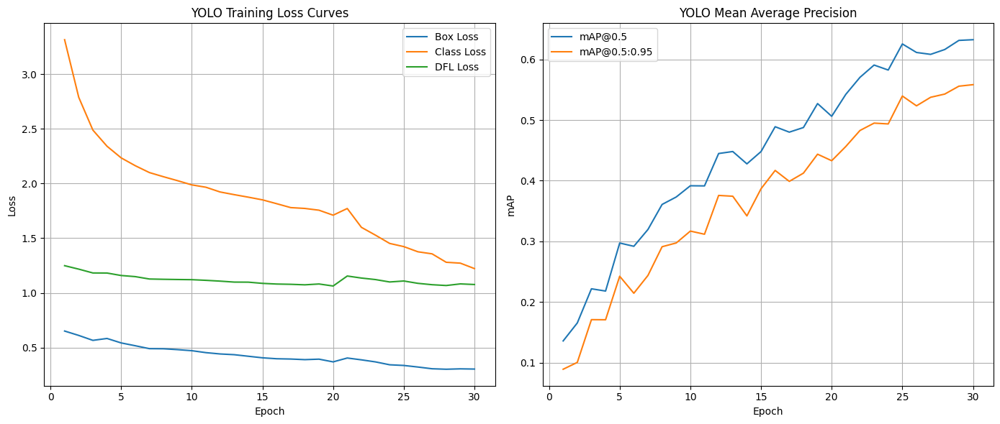

In [77]:
# Path to YOLO training log (generated automatically after training)
csv_path = "runs/detect/train2/results.csv"  # adjust if you named your run differently

plot_yolo_training_metrics(csv_path)


In [78]:
import os
import random
import cv2
import matplotlib.pyplot as plt
from ultralytics import YOLO

def test_random_yolo_detections(model, img_dir, num_images=5, conf=0.25, device="cuda", save_dir=None):
    """
    Test YOLO detection model on random images and show bounding boxes.

    Args:
        model: YOLO detection model (e.g. YOLO("yolov8n.pt") or trained model)
        img_dir (str): Path to image directory (test folder)
        num_images (int): Number of random images to visualize
        conf (float): Confidence threshold
        device (str): 'cuda' or 'cpu'
        save_dir (str): Optional directory to save predictions
    """
    # Collect all image paths
    img_paths = [
        os.path.join(img_dir, f)
        for f in os.listdir(img_dir)
        if f.lower().endswith((".jpg", ".jpeg", ".png"))
    ]

    if len(img_paths) == 0:
        print(f"⚠️ No images found in: {img_dir}")
        return

    # Pick random images
    selected_imgs = random.sample(img_paths, min(num_images, len(img_paths)))

    # Run YOLO predictions
    results = model.predict(
        source=selected_imgs,
        conf=conf,
        device=device,
        save=bool(save_dir),
        project=save_dir if save_dir else None,
        verbose=False
    )

    # Display results
    plt.figure(figsize=(16, 10))
    cols = 3
    rows = (len(results) + cols - 1) // cols

    for i, (res, path) in enumerate(zip(results, selected_imgs)):
        img = cv2.imread(path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        # Draw boxes manually for better notebook display
        for box in res.boxes:
            xyxy = box.xyxy[0].cpu().numpy()
            conf_score = float(box.conf)
            cls_id = int(box.cls)
            label = f"{res.names[cls_id]} {conf_score:.2f}"

            x1, y1, x2, y2 = map(int, xyxy)
            color = (0, 255, 0)
            cv2.rectangle(img, (x1, y1), (x2, y2), color, 2)
            cv2.putText(img, label, (x1, y1 - 10),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.6, color, 2)

        ax = plt.subplot(rows, cols, i + 1)
        ax.imshow(img)
        ax.axis("off")
        ax.set_title(os.path.basename(path))

    plt.tight_layout()
    plt.show()


In [79]:
save_model(name="ultra_yolo_det", model=model)

✅ Ultralytics YOLO model saved to saved_models/ultra_yolo_det.pt


'saved_models/ultra_yolo_det.pt'

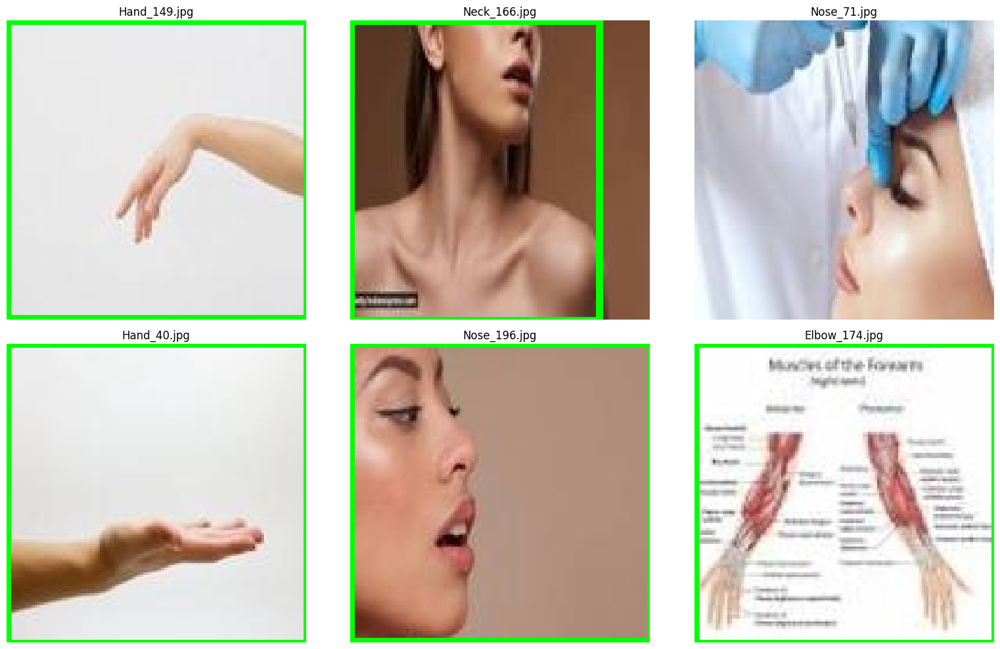

In [80]:
from ultralytics import YOLO

# Load your trained model
# model = YOLO("runs/detect/train/weights/best.pt")
model=YOLO("saved_models/ultra_yolo_det.pt")

# Path to your test images
test_img_dir = "/content/body_parts_yolo/images/test"

# Show random predictions with bounding boxes
test_random_yolo_detections(model, test_img_dir, num_images=6, conf=0.3)


## For Ultralytic Yolo SEG model

In [81]:
import cv2, numpy as np
from tqdm import tqdm

def generate_pseudo_segmentation_masks(root_dir, out_root="/content/body_parts_seg"):
    for split in ["train","val","test"]:
        src_split = os.path.join(root_dir, split)
        out_img_dir = os.path.join(out_root, "images", split)
        out_mask_dir = os.path.join(out_root, "masks", split)
        os.makedirs(out_img_dir, exist_ok=True)
        os.makedirs(out_mask_dir, exist_ok=True)

        class_names = sorted(os.listdir(src_split))
        class_to_id = {c:i for i,c in enumerate(class_names)}

        for cls in class_names:
            class_dir = os.path.join(src_split, cls)
            imgs = [f for f in os.listdir(class_dir) if f.lower().endswith((".jpg",".png",".jpeg"))]
            for f in tqdm(imgs, desc=f"{split}/{cls}"):
                img_path = os.path.join(class_dir, f)
                img = cv2.imread(img_path)
                if img is None: continue
                H, W = img.shape[:2]

                gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
                blur = cv2.GaussianBlur(gray,(5,5),0)
                _,th = cv2.threshold(blur,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
                mask = cv2.bitwise_not(th)

                # Save mask
                mask_path = os.path.join(out_mask_dir, f)
                cv2.imwrite(mask_path, mask)
                # Copy image
                cv2.imwrite(os.path.join(out_img_dir, f), img)

    print(f"✅ Masks generated in {out_root}")
    return out_root


In [82]:
root_dir="/content/data/body_parts_split"
seg_root = generate_pseudo_segmentation_masks(root_dir)


test/Shoulders: 100%|██████████| 21/21 [00:00<00:00, 833.33it/s]

✅ Masks generated in /content/body_parts_seg


In [83]:
print(seg_root)

/content/body_parts_seg


In [84]:
import os
import cv2
import numpy as np
from tqdm import tqdm

def create_yolo_segmentation_labels(seg_root, class_to_id=None, min_area=50):
    """
    Convert segmentation masks (.png, .jpg, .jpeg) to YOLO segmentation polygon labels (.txt)
    for all splits (train, val, test).

    Args:
        seg_root (str): Root folder containing 'masks/' and 'images/'.
        class_to_id (dict): Optional {class_name: id} mapping. If None, all = 0.
        min_area (int): Minimum contour area (ignore tiny noise).
    """
    splits = ["train", "val", "test"]
    mask_root = os.path.join(seg_root, "masks")
    label_root = os.path.join(seg_root, "labels")
    os.makedirs(label_root, exist_ok=True)

    total_converted = 0

    for split in splits:
        mask_dir = os.path.join(mask_root, split)
        if not os.path.exists(mask_dir):
            print(f"⚠️ Skipping '{split}' — no mask directory found: {mask_dir}")
            continue

        # ✅ include .jpg, .jpeg, .png
        mask_files = [
            f for f in os.listdir(mask_dir)
            if f.lower().endswith((".png", ".jpg", ".jpeg"))
        ]

        if len(mask_files) == 0:
            print(f"⚠️ No mask files found in {mask_dir}")
            continue

        lbl_dir = os.path.join(label_root, split)
        os.makedirs(lbl_dir, exist_ok=True)

        for f in tqdm(mask_files, desc=f"Converting masks ({split})"):
            mask_path = os.path.join(mask_dir, f)
            mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
            if mask is None:
                print(f"⚠️ Could not read mask: {mask_path}")
                continue

            H, W = mask.shape
            contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
            label_path = os.path.join(lbl_dir, f.rsplit('.', 1)[0] + ".txt")

            with open(label_path, "w") as lf:
                valid_contours = 0
                for cnt in contours:
                    if cv2.contourArea(cnt) < min_area:
                        continue
                    valid_contours += 1
                    cnt = cnt.squeeze()
                    if len(cnt.shape) != 2:
                        continue
                    # Normalize coordinates
                    norm = []
                    for x, y in cnt:
                        norm.append(x / W)
                        norm.append(y / H)
                    cls_id = 0 if class_to_id is None else list(class_to_id.values())[0]
                    lf.write(f"{cls_id} " + " ".join(f"{n:.6f}" for n in norm) + "\n")

            total_converted += valid_contours

        print(f"✅ {split}: {len(mask_files)} masks processed")

    print(f"\n🎯 Conversion complete! Total polygons written: {total_converted}")



In [85]:
create_yolo_segmentation_labels(seg_root)

Converting masks (train): 100%|██████████| 1472/1472 [00:03<00:00, 397.83it/s]


✅ train: 1472 masks processed


Converting masks (val): 100%|██████████| 416/416 [00:00<00:00, 451.66it/s]


✅ val: 416 masks processed


Converting masks (test): 100%|██████████| 204/204 [00:00<00:00, 442.94it/s]

✅ test: 204 masks processed

🎯 Conversion complete! Total polygons written: 4089


In [86]:
import yaml, os

def create_seg_yaml(seg_root, class_names):
    yaml_dict = {
        "train": os.path.join(seg_root,"images/train"),
        "val": os.path.join(seg_root,"images/val"),
        "test": os.path.join(seg_root,"images/test"),
        "nc": len(class_names),
        "names": class_names
    }
    yaml_path = os.path.join(seg_root,"body_parts_seg.yaml")
    with open(yaml_path,"w") as f: yaml.dump(yaml_dict,f)
    print(f"✅ YAML saved at: {yaml_path}")
    return yaml_path

classes = sorted(os.listdir("/content/DLCV_Lab_Dataset/Body Parts Dataset"))
yaml_path = create_seg_yaml(seg_root, classes)


✅ YAML saved at: /content/body_parts_seg/body_parts_seg.yaml


In [88]:
# flush_yolo_cache(seg_root)

In [89]:
import os

seg_root = "/content/body_parts_seg"  # or your dataset root

for split in ["train", "val", "test"]:
    lbl_dir = os.path.join(seg_root, "labels", split)
    imgs = os.listdir(os.path.join(seg_root, "images", split))
    lbls = os.listdir(lbl_dir) if os.path.exists(lbl_dir) else []
    print(f"{split}: {len(imgs)} images, {len(lbls)} labels")


train: 1472 images, 1472 labels
val: 416 images, 416 labels
test: 204 images, 204 labels


In [90]:
from ultralytics import YOLO

model = YOLO("yolov8n-seg.pt")
results = model.train(
    data=yaml_path,
    epochs=20,
    imgsz=640,
    batch=8
)


Ultralytics 8.3.224 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/body_parts_seg/body_parts_seg.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=20, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plo

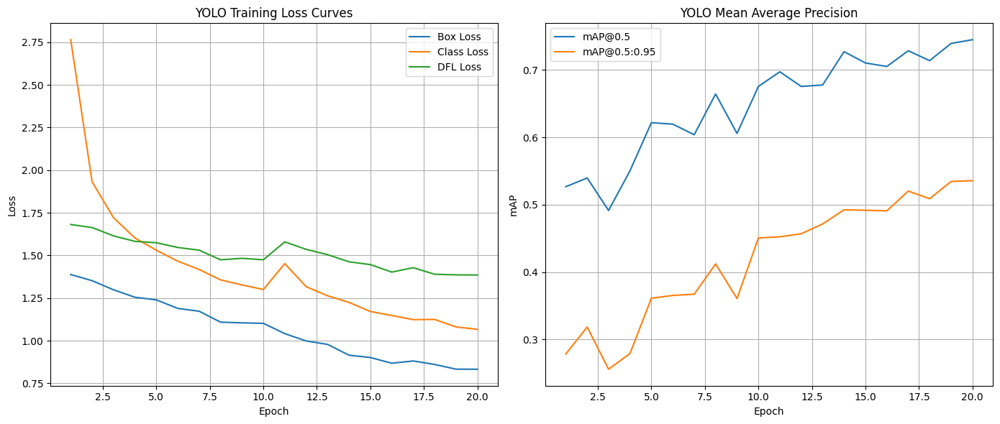

In [97]:
# Path to YOLO training log (generated automatically after training)
csv_path = "runs/segment/train/results.csv"  # adjust if you named your run differently

plot_yolo_training_metrics(csv_path)

In [92]:
save_model(name="ultra_yolo_seg", model=model)

✅ Ultralytics YOLO model saved to saved_models/ultra_yolo_seg.pt


'saved_models/ultra_yolo_seg.pt'

In [93]:
import os
import random
import cv2
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO

def test_random_segmentation_predictions(model, img_dir, num_images=6, conf=0.25, device="cuda"):
    """
    Test YOLO segmentation model on random images and visualize masks + boxes + labels
    with dynamically scaled font size and thickness.
    """
    img_paths = [
        os.path.join(img_dir, f)
        for f in os.listdir(img_dir)
        if f.lower().endswith((".jpg", ".jpeg", ".png"))
    ]
    if not img_paths:
        print(f"❌ No images found in {img_dir}")
        return

    selected_imgs = random.sample(img_paths, min(num_images, len(img_paths)))
    results = model.predict(
        source=selected_imgs,
        conf=conf,
        device=device,
        save=False,
        verbose=False
    )

    plt.figure(figsize=(16, 10))
    cols = 3
    rows = (len(results) + cols - 1) // cols

    for i, (res, path) in enumerate(zip(results, selected_imgs)):
        img = cv2.imread(path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        H, W = img.shape[:2]

        # Dynamically adjust label size
        base_thickness = max(1, int(min(W, H) / 500))      # e.g., 1–5 px
        base_font_scale = min(W, H) / 800.0                # e.g., 0.4–1.5
        base_font_scale = max(0.4, min(base_font_scale, 1.2))

        if hasattr(res, "masks") and res.masks is not None:
            for mask, box, cls_id, conf_score in zip(
                res.masks.data, res.boxes.xyxy, res.boxes.cls, res.boxes.conf
            ):
                # Resize mask to image size
                mask = mask.cpu().numpy()
                mask_resized = cv2.resize(mask, (W, H))

                color = np.random.randint(0, 255, (3,), dtype=np.uint8)
                color_mask = np.zeros_like(img, dtype=np.uint8)
                color_mask[mask_resized > 0.5] = color
                img = cv2.addWeighted(img, 1, color_mask, 0.5, 0)

                # Draw bounding box and label
                x1, y1, x2, y2 = map(int, box.cpu().numpy())
                label = f"{res.names[int(cls_id)]} {float(conf_score):.2f}"
                cv2.rectangle(img, (x1, y1), (x2, y2), color.tolist(), base_thickness)
                cv2.putText(
                    img, label, (x1, max(20, y1 - 10)),
                    cv2.FONT_HERSHEY_SIMPLEX, base_font_scale, color.tolist(), base_thickness, cv2.LINE_AA
                )

        ax = plt.subplot(rows, cols, i + 1)
        ax.imshow(img)
        ax.set_title(os.path.basename(path))
        ax.axis("off")

    plt.tight_layout()
    plt.show()


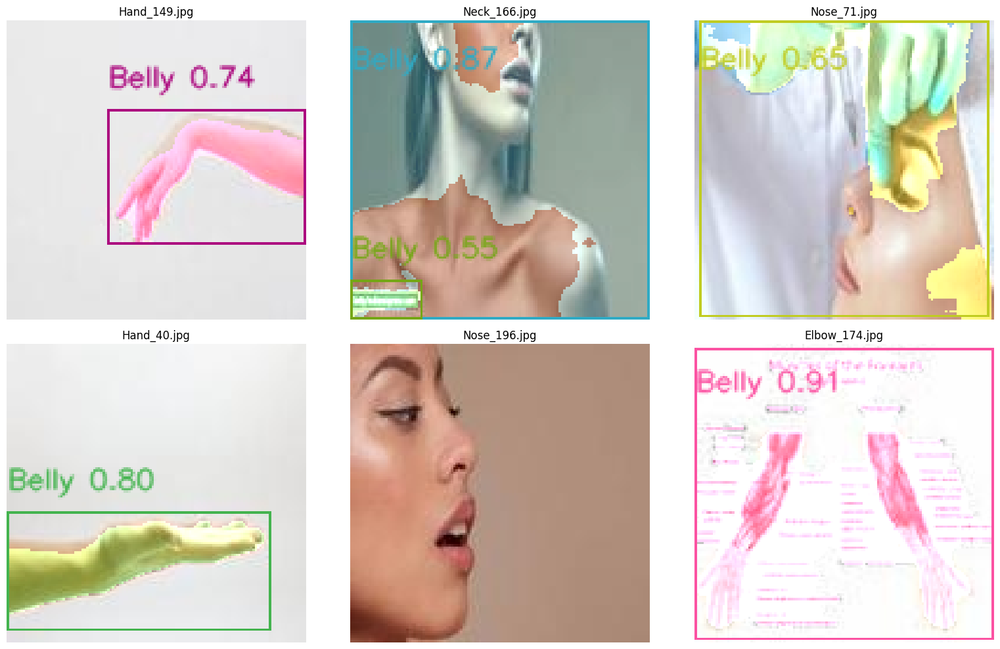

In [94]:
from ultralytics import YOLO

# Load trained segmentation model
model = YOLO("saved_models/ultra_yolo_seg.pt")

# Path to test images
test_img_dir = "/content/body_parts_seg/images/test"

# Test on random images

# Test on random validation images
test_random_segmentation_predictions(
    model,
    img_dir="/content/body_parts_seg/images/test",
    num_images=6,
    conf=0.5
)


In [95]:
import os
import random
import cv2
import numpy as np
import matplotlib.pyplot as plt
from ultralytics import YOLO

def test_segmentation_predictions_ioufilter(
    model,
    img_dir,
    mask_dir=None,
    num_images=6,
    conf=0.25,
    iou_thresh=0.5,
    device="cuda",
    randomize=True,
    seed=42
):
    """
    Visualize YOLO segmentation predictions with IoU-based label filtering.

    Args:
        model: YOLO segmentation model (trained or pretrained)
        img_dir (str): Directory containing test images
        mask_dir (str): Directory containing ground-truth masks (optional)
        num_images (int): Number of images to display
        conf (float): Confidence threshold for predictions
        iou_thresh (float): IoU threshold to display labels/bounding boxes
        device (str): 'cuda' or 'cpu'
        randomize (bool): If True, select random subset of images
        seed (int): Random seed for reproducibility
    """

    img_paths = [
        os.path.join(img_dir, f)
        for f in os.listdir(img_dir)
        if f.lower().endswith((".jpg", ".jpeg", ".png"))
    ]
    if not img_paths:
        print(f"❌ No images found in {img_dir}")
        return

    # Set random seed
    random.seed(seed)

    # Choose images
    if randomize:
        selected_imgs = random.sample(img_paths, min(num_images, len(img_paths)))
    else:
        selected_imgs = img_paths[:num_images]

    # Run model inference
    results = model.predict(
        source=selected_imgs,
        conf=conf,
        device=device,
        save=False,
        verbose=False
    )

    # Plot setup
    plt.figure(figsize=(16, 10))
    cols = 3
    rows = (len(results) + cols - 1) // cols

    for i, (res, path) in enumerate(zip(results, selected_imgs)):
        img = cv2.imread(path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        H, W = img.shape[:2]

        # Load GT mask if available
        gt_mask = None
        if mask_dir:
            base = os.path.splitext(os.path.basename(path))[0]
            for ext in [".png", ".jpg", ".jpeg"]:
                p = os.path.join(mask_dir, base + ext)
                if os.path.exists(p):
                    gt_mask = cv2.imread(p, cv2.IMREAD_GRAYSCALE)
                    gt_mask = cv2.resize(gt_mask, (W, H))
                    break

        base_thickness = max(1, int(min(W, H) / 500))
        base_font_scale = max(0.4, min(min(W, H) / 800.0, 1.2))

        if hasattr(res, "masks") and res.masks is not None:
            for mask, box, cls_id, conf_score in zip(
                res.masks.data, res.boxes.xyxy, res.boxes.cls, res.boxes.conf
            ):
                mask = mask.cpu().numpy()
                mask_resized = cv2.resize(mask, (W, H))
                pred_bin = (mask_resized > 0.5).astype(np.uint8)

                # Compute IoU (for filtering)
                if gt_mask is not None:
                    gt_bin = (gt_mask > 127).astype(np.uint8)
                    intersection = np.logical_and(gt_bin, pred_bin).sum()
                    union = np.logical_or(gt_bin, pred_bin).sum()
                    iou = intersection / union if union > 0 else 0.0
                else:
                    iou = 1.0  # display all if no GT

                # Skip low-IoU detections
                if iou < iou_thresh:
                    continue

                color = np.random.randint(0, 255, (3,), dtype=np.uint8)
                color_mask = np.zeros_like(img, dtype=np.uint8)
                color_mask[pred_bin > 0] = color
                img = cv2.addWeighted(img, 1, color_mask, 0.5, 0)

                x1, y1, x2, y2 = map(int, box.cpu().numpy())
                label = f"{res.names[int(cls_id)]} {float(conf_score):.2f}"
                cv2.rectangle(img, (x1, y1), (x2, y2), color.tolist(), base_thickness)
                cv2.putText(
                    img, label, (x1, max(20, y1 - 10)),
                    cv2.FONT_HERSHEY_SIMPLEX, base_font_scale,
                    color.tolist(), base_thickness, cv2.LINE_AA
                )

        ax = plt.subplot(rows, cols, i + 1)
        ax.imshow(img)
        ax.set_title(os.path.basename(path))
        ax.axis("off")

    plt.tight_layout()
    plt.show()


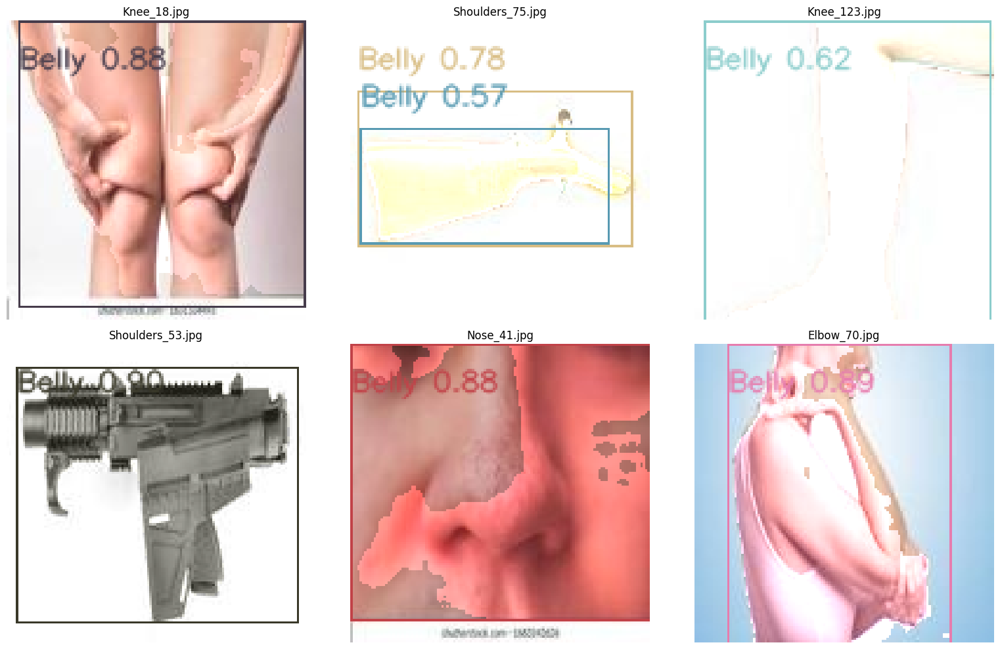

In [107]:
from ultralytics import YOLO

# Load trained segmentation model
# model = YOLO("runs/segment/train/weights/best.pt")
model = YOLO("saved_models/ultra_yolo_seg.pt")

test_segmentation_predictions_ioufilter(
    model,
    img_dir="/content/body_parts_seg/images/test",
    mask_dir="/content/body_parts_seg/masks/test",
    num_images=6,
    conf=0.4,
    iou_thresh=0.3,
    randomize=True,   # ✅ random sampling
    seed=123          # ✅ reproducible results
)
